In [1]:
import numpy as np
import glob
import csv
from rapidfuzz.string_metric import normalized_levenshtein
import moleculegraph
from moleculegraph.funcs import *
from moleculegraph.molecule_utils import *
from calc_intramol.forces import *
import matplotlib.pyplot as plt
from scipy.constants import R

In [6]:

name = "ethanediol"
special_bonds = True
mol = "[cH_alcohol][OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol][cH_alcohol]"
pathstring = "ethanediol/scan_part_2/results/tors_*40.00.xyz"
angle_pointer = -3
cut_angles=1600
opt = "[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]"

#pathstring = "DARUS/ethanediol/scan_part_1/results/tors_*90.00.xyz"
#angle_pointer = -3
#cut_angles=1600

#pathstring = "DARUS/ethanediol/min_geometry_scan/results/tors_*0.00.xyz"
#angle_pointer = -1
#cut_angles=160



#name = "propanediol"
#special_bonds = True

#mol = "[cH_alcohol][OH_alcohol][CH2_alcohol][CH2_alkane][CH2_alcohol][OH_alcohol][cH_alcohol]"
#pathstring = "DARUS/propanediol/dft_torsion_OCCC/results/tors_*.00.xyz"

#opt =  "[CH2_alcohol][CH2_alkane][CH2_alcohol][OH_alcohol]"
#ff = "force-fields-diols/"
#angle_pointer = -3
#cut_angles=1600


ff = "force-fields-diols/"



['ethanediol/scan_part_2/results/tors_0.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_10.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_100.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_110.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_120.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_130.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_140.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_150.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_160.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_170.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_180.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_20.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_30.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_40.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_50.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results/tors_60.00_tors_40.00.xyz', 'ethanediol/scan_part_2/results

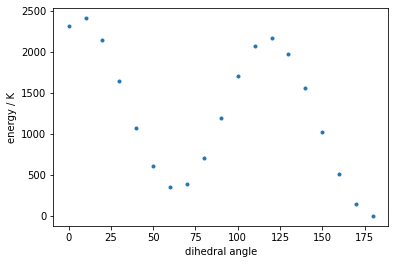

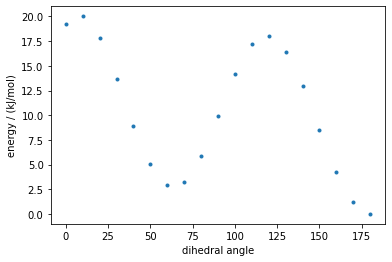

In [7]:

paths = sorted( glob.glob(pathstring) )
print(paths)

angles = []
coordinates = []
energies = []
xyzs = []
for path in paths:
    xyz,energy = read_xyz(path,energy=True)
    angles.append(float( path.split("/")[-1].split("_")[angle_pointer].replace(".xyz","") ))
    xyzs.append(xyz)
    dummy = np.zeros( ( len(xyz), 3 ) )
    for key in xyz:
        dummy[key] = xyz[key]["xyz"]
    coordinates.append( dummy )
    energies.append(energy)

angles = np.array(angles)
p = np.where( angles < cut_angles )
energies = np.array(energies)[p]
angles = angles[p]
xyzs = np.array(xyzs)[p]
coordinates = np.array(coordinates)[p]

print( *angles, sep=", ")
print( *energies, sep=", ")

p = np.argsort(angles)
angles = angles[p]
energies = np.array(energies)[p]
energies = ( energies - np.min(energies) )*2625.5/R*1000
xyzs = np.array(xyzs)[p]
coordinates = np.array(coordinates)[p]


plt.plot(angles,energies,".")
plt.xlabel("dihedral angle")
plt.ylabel("energy / K")
plt.show()
plt.close()

plt.plot(angles,energies*R/1000,".")
plt.xlabel("dihedral angle")
plt.ylabel("energy / (kJ/mol)")
plt.show()
plt.close()

In [9]:

pair_pots = read_pair_potentials(glob.glob(ff+"UA_devel/pair_potentials")[0])
angle_pots = read_angle_potentials(glob.glob(ff+"UA_devel/angle_potentials")[0])
torsion_pots = read_torsion_potentials(glob.glob(ff+"UA_devel/torsion_potentials")[0])
#/home/derwer/Desktop/PHD/QM/amines/force-fields/UA_devel

#pair_pots = read_pair_potentials(glob.glob("/home/derwer/Desktop/PHD/QM/alkanes/new-force-fields/UA_devel/pair_potentials")[0])
#angle_pots = read_angle_potentials(glob.glob("/home/derwer/Desktop/PHD/QM/alkanes/new-force-fields/UA_devel/angle_potentials")[0])
#torsion_pots = read_torsion_potentials(glob.glob("/home/derwer/Desktop/PHD/QM/alkanes/new-force-fields/UA_devel/torsion_potentials")[0])

#pair_pots = read_pair_potentials(glob.glob("/home/derwer/Desktop/PHD/QM/amines/force-fields_pot/UA_devel/pair_potentials")[0])
#angle_pots = read_angle_potentials(glob.glob("/home/derwer/Desktop/PHD/QM/amines/force-fields_pot/UA_devel/angle_potentials")[0])
#torsion_pots = read_torsion_potentials(glob.glob("/home/derwer/Desktop/PHD/QM/amines/force-fields_pot/UA_devel/torsion_potentials")[0])

In [10]:
pair_pots

{'CH3_alkane': {'name': 'CH3_alkane',
  'mass': 15.035,
  'epsilon': 136.318,
  'sigma': 3.603,
  'm': 14.0,
  'cut': 14.0,
  'charge': 0.0},
 'CH2_alkane': {'name': 'CH2_alkane',
  'mass': 14.027,
  'epsilon': 52.913,
  'sigma': 4.04,
  'm': 14.0,
  'cut': 14.0,
  'charge': 0.0},
 'OH_alcohol': {'name': 'OH_alcohol',
  'mass': 17.007,
  'epsilon': 84.23,
  'sigma': 3.035,
  'm': 12.0,
  'cut': 14.0,
  'charge': -0.65},
 'CH2_alcohol': {'name': 'CH2_alcohol',
  'mass': 14.027,
  'epsilon': 84.23,
  'sigma': 3.842,
  'm': 14.0,
  'cut': 14.0,
  'charge': 0.246},
 'cH_alcohol': {'name': 'H',
  'mass': 1.0,
  'epsilon': 0.0,
  'sigma': 1.0,
  'm': 12.0,
  'cut': 0.0,
  'charge': 0.404}}


 additional Coul interactions
[0 3] [CH2_alcohol][cH_alcohol] 3.0
[0 4] [OH_alcohol][cH_alcohol] 4.0
[0 5] [cH_alcohol][cH_alcohol] 5.0
[1 3] [CH2_alcohol][OH_alcohol] 2.0
[1 4] [OH_alcohol][OH_alcohol] 3.0
[1 5] [OH_alcohol][cH_alcohol] 4.0
[2 3] [CH2_alcohol][CH2_alcohol] 1.0
[2 4] [CH2_alcohol][OH_alcohol] 2.0
[2 5] [CH2_alcohol][cH_alcohol] 3.0

 additional Mie interactions
[1 4] [OH_alcohol][OH_alcohol] 3.0


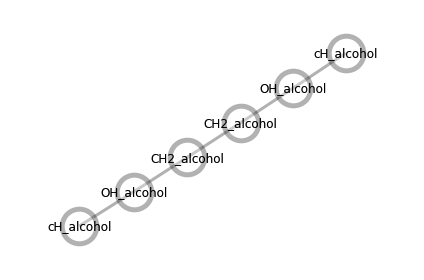

In [11]:
#Add Special Bond via bond_style table command
molecule = moleculegraph.molecule(mol)

if special_bonds:
    
    #Get local dipoles in the molecule
    #todo: check if this works for every molecule

    flag = 0
    dipol_list = []
    for i,(atom,no) in enumerate(zip(molecule.atom_names,molecule.atom_numbers)):
            
        if (pair_pots[atom]["charge"] != 0 and flag == 0):
            dipol = []
            chrg = 0
            chrg += pair_pots[atom]["charge"]
            flag = 1
            dipol.append(no)

        elif(pair_pots[atom]["charge"] != 0 and flag == 1):

            #Check if next atom is bonded to the previous one

            atom_no1 = molecule.atom_numbers[i]
            atom_no2 = molecule.atom_numbers[i-1]
            bond_distance = molecule.get_distance(atom_no1,atom_no2)

            if bond_distance == 1:
                chrg += pair_pots[atom]["charge"]
                dipol.append(no)

            #Check if the total charge is 0, then its a local dipol

                if np.round(chrg,3) == 0:
                    dipol_list.append(dipol)
                    flag = 0
    # make special_bonds
    special_bond_numbers = np.array( np.meshgrid( dipol_list[0], dipol_list[1] ) ).T.reshape(-1, 2)
    special_bond_names = molecule.atom_names[special_bond_numbers]
    special_bond_keys = [ moleculegraph.make_graph(moleculegraph.sort_force_fields(x)) for x in special_bond_names ]
    #special_bond_keys_unique, uidx = np.unique(special_bond_keys, return_index=True)
    #special_bond_names_unique = special_bond_names[uidx]
    print("\n additional Coul interactions")
    #print(special_bond_keys)
    for num,key in zip( special_bond_numbers, special_bond_keys ):
        print( num, key, molecule.get_distance(num[0],num[1]) )

    p = np.where( molecule.torsion_keys == opt )
    opt_tors = molecule.torsion_list[p]
    additional_mie_numbers = np.array( [  (a,d) for a,b,c,d in opt_tors   ] )    
    additional_mie_names = molecule.atom_names[additional_mie_numbers]
    additional_mie_keys = [ moleculegraph.make_graph(moleculegraph.sort_force_fields(x)) for x in additional_mie_names ]    
    print("\n additional Mie interactions")
    for num,key in zip( additional_mie_numbers, additional_mie_keys ):
        print( num, key, molecule.get_distance(num[0],num[1]) )
    
    
else:
    special_bond_numbers = []
    additional_mie_numbers = []
    print("nothing to be done")
    
molecule.visualize()

In [12]:

def get_energy( molecule, coords, pair_pots, angle_pots, 
               torsion_pots, additional_charge_numbers=[], additional_mie_numbers=[] ):
    # 1) assign stuff!!
    atom_paras     = molecule.map_molecule( molecule.atom_names, pair_pots ) 
    angle_paras    = molecule.map_molecule( molecule.angle_keys, angle_pots )
    torsion_paras  = molecule.map_molecule( molecule.torsion_keys, torsion_pots )
    #print(molecule.torsion_keys)
    #print(torsion_paras)

    # 2) loop and calc... lol
    #print( molecule.angle_list)
    #print(coords)
    angles   =  [ angle_between( *coords[t] ) for t in molecule.angle_list  ] 
    torsions =  [ dihedral( *coords[t] ) for t in molecule.torsion_list  ] 
    #print(np.degrees(angles))
    #print(np.degrees(torsions))

    #print()
    
    pot_energy = 0.0
    angle_energy = 0.0
    torsion_energy = 0.0
    pair_energy = 0.0
    charge_group_energy = 0.0
    for angle, apot in zip( angles, angle_paras ):
        energy = 0.
        #print(angle, apot)
        energy = bend(angle,apot)
        angle_energy += energy
        pot_energy += energy
        #print("angle",angle )

    for tor, tpot in zip( torsions, torsion_paras ):
        energy = 0.
        energy = torsion_types(tor,tpot,tpot["type"])
        torsion_energy += energy
        pot_energy += energy
        #print("torsion",tor )
        
    for a, apot in zip( molecule.atom_numbers , atom_paras ):
        for b, bpot in zip( molecule.atom_numbers, atom_paras ):
            energy = 0.
            if b > a and molecule.get_distance(a,b) > 3:
                r_ab = distance( coords[a], coords[b] )
                energy = mieq(r_ab,apot,bpot)
                print("mie",a,b,energy, r_ab)
                pair_energy += energy
                pot_energy += energy

    if np.sum(additional_mie_numbers.shape)>0:
        for a,b in additional_mie_numbers:
            energy = 0.
            r_ab = distance( coords[a], coords[b] )
            apot = atom_paras[a]
            bpot = atom_paras[b]        
            if molecule.get_distance(a,b) <= 3:
                energy = mie(r_ab,apot,bpot)
                print("additional_mie",a,b,energy)
            pair_energy += energy
            pot_energy += energy                

    #print(additional_charge_numbers)
    if np.sum(additional_charge_numbers.shape)>0:
        for a,b in additional_charge_numbers:
            energy = 0.
            r_ab = distance( coords[a], coords[b] )
            apot = atom_paras[a]
            bpot = atom_paras[b]        
            if molecule.get_distance(a,b) <= 3:
                energy = qcharge(r_ab,apot,bpot)
                print("additional_charge",a,b,energy)

            #charge_group_energy += energy
            pair_energy += energy
            pot_energy += energy
                
    #print(pair_energy)
    #print(angle_energy)
    #print(torsion_energy)
    #print(pot_energy)
    return pot_energy, pair_energy, angle_energy, torsion_energy, charge_group_energy



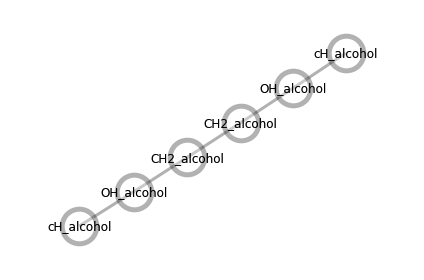

0.0
mie 2.168975423882394 H OH_alcohol
mie 0 4 -20230.962616484478 2.168975423882394
mie 3.058188038756705 H H
mie 0 5 8918.154704609387 3.058188038756705
mie 3.5213933233657 OH_alcohol H
mie 1 5 -12461.10748988924 3.5213933233657
additional_mie 1 4 1593.3477948685252
ch 2.492970051405297 H CH2_alcohol
additional_charge 0 3 6661.558834956144
ch 2.481974869076458 OH_alcohol CH2_alcohol
additional_charge 1 3 -10765.334802246043
ch 2.567011071753817 OH_alcohol OH_alcohol
additional_charge 1 4 27502.70613549494
ch 1.5482241727599948 CH2_alcohol CH2_alcohol
additional_charge 2 3 6531.4984374142205
ch 2.4136442167181 CH2_alcohol OH_alcohol
additional_charge 2 4 -11070.103145814852
ch 3.2408229390000467 CH2_alcohol H
additional_charge 2 5 5124.336313277308
10.0
mie 2.265435097461702 H OH_alcohol
mie 0 4 -19369.551026115903 2.265435097461702
mie 3.149260311211673 H H
mie 0 5 8660.253948624802 3.149260311211673
mie 3.5403988872063232 OH_alcohol H
mie 1 5 -12394.21379189951 3.5403988872063232
ad

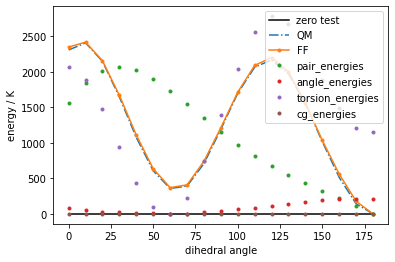

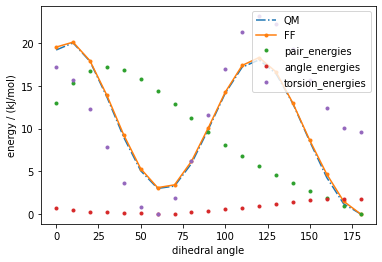

In [13]:

molecule = moleculegraph.molecule(mol)
molecule.visualize()
# energy calc using xx class here!!!

pot_energies = []
pair_energies = np.zeros(len(coordinates))
angle_energies = np.zeros(len(coordinates))
torsion_energies = np.zeros(len(coordinates))
cg_energies = np.zeros(len(coordinates))
for i,coords in enumerate(coordinates):
    print( angles[i] )

    pot_energy, pair_energy, angle_energy, torsion_energy, cg_energy = get_energy( molecule, coords, pair_pots, 
                                                                        angle_pots, torsion_pots,
                                                                        additional_charge_numbers=special_bond_numbers,
                                                                        additional_mie_numbers=additional_mie_numbers
                                                                                 )
    
    pot_energies.append(pot_energy)
    pair_energies[i] = pair_energy
    angle_energies[i] = angle_energy
    torsion_energies[i] = torsion_energy
    cg_energies[i] = cg_energy

test = pot_energies -pair_energies- angle_energies- torsion_energies- cg_energies    
    
mimin = True
#mimin = False
if mimin:
    pot_energies = np.array(pot_energies)
    pot_energies = pot_energies - np.min(pot_energies)
    angle_energies = angle_energies - np.min(angle_energies)
    pair_energies = pair_energies - np.min(pair_energies)
    torsion_energies = torsion_energies - np.min(torsion_energies)
    cg_energies = cg_energies - np.min(cg_energies)
    test = test - np.min(test)

#test = energies-pot_energies+pot_energies[::-1]-cg_energies+cg_energies[::-1]
#test = test[::-1]
#test = angle_energies+torsion_energies

plt.plot(angles,test,"k-",label="zero test")
plt.plot(angles,energies,"-.",label="QM")

plt.plot(angles,pot_energies,".-",label="FF")
plt.plot(angles,pair_energies,".",label="pair_energies")
plt.plot(angles,angle_energies,".",label="angle_energies")
plt.plot(angles,torsion_energies,".",label="torsion_energies")
plt.plot(angles,cg_energies,".",label="cg_energies")
plt.xlabel("dihedral angle")
plt.ylabel("energy / K")
plt.savefig(name+"_QM_vs_FF_torsion_scan"+path.split(name)[-1].split("/")[1]+".png")
plt.legend()
plt.show()
plt.close()

plt.plot(angles,energies*R/1000,"-.",label="QM")
plt.plot(angles,pot_energies*R/1000,".-",label="FF")
plt.plot(angles,pair_energies*R/1000,".",label="pair_energies")
plt.plot(angles,angle_energies*R/1000,".",label="angle_energies")
plt.plot(angles,torsion_energies*R/1000,".",label="torsion_energies")
#plt.plot(angles,cg_energies*R/1000,".",label="cg_energies")
plt.xlabel("dihedral angle")
plt.ylabel("energy / (kJ/mol)")
plt.savefig(name+"_QM_vs_FF_torsion_scan"+path.split(name)[-1].split("/")[1]+".png")
plt.legend()
plt.show()
plt.close()

# 3) fitting: keep the fixed parts :) should be easy then :)
#    comment: ehtyl and butylamine do not have intramolecular vdw

In [14]:
coords

for ibnd in molecule.bond_list:
    a = ibnd[0]
    b = ibnd[1]
    print(  molecule.atom_names[a], molecule.atom_names[b] , distance( coords[a], coords[b] ) )


cH_alcohol OH_alcohol 0.9632479243180023
OH_alcohol CH2_alcohol 1.425285495648728
CH2_alcohol CH2_alcohol 1.5142075836995466
CH2_alcohol OH_alcohol 1.4222658043235588
OH_alcohol cH_alcohol 0.962091587565602


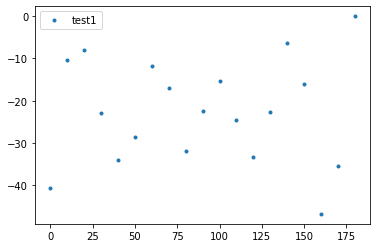

In [15]:
test1 = pot_energies -pair_energies- angle_energies- torsion_energies- cg_energies  
test1 = energies -pot_energies

#plt.plot(angles,energies,".",label="QM")
plt.plot(angles,test1,".",label="test1")
#plt.plot(angles,pot_energies,".",label="FF")
plt.legend()

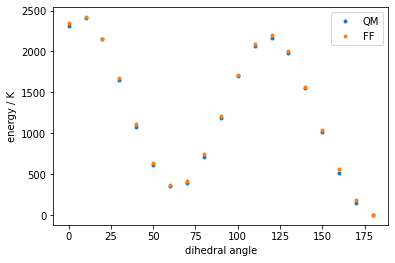

In [16]:
plt.plot(angles,np.array(energies),".",label="QM")
plt.plot(angles,np.array(pot_energies),".",label="FF")
plt.xlabel("dihedral angle")
plt.ylabel("energy / K")
plt.savefig(name+"_QM_vs_FF_torsion_scan"+path.split(name)[-1].split("/")[1]+".png")
plt.legend()
plt.show()
plt.close()

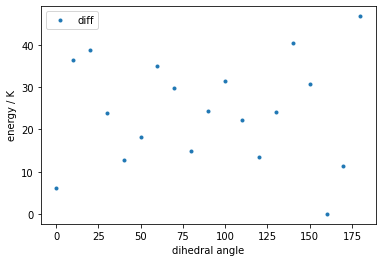

In [17]:
diff = np.array(energies) - np.array(pot_energies)
diff -= np.min(diff)

plt.plot(angles,diff,".",label="diff")
plt.xlabel("dihedral angle")
plt.ylabel("energy / K")
plt.savefig(name+"_QM_vs_FF_torsion_scan"+path.split(name)[-1].split("/")[1]+".png")
plt.legend()
plt.show()
plt.close()

In [18]:
from scipy.optimize import curve_fit,minimize

class torsion_fit():
    def __init__(self, ref_energy ,molecule, coordinates, pair_pots, angle_pots, torsion_pots, 
                 optimize,additional_charge_numbers=[],additional_mie_numbers=[]):
        self.ref_energy = ref_energy
        self.molecule = molecule
        self.coordinates = coordinates
        self.pair_pots = pair_pots
        self.angle_pots = angle_pots
        self.torsion_pots = torsion_pots
        self.optimize = optimize
        self.additional_charge_numbers= np.atleast_2d(additional_charge_numbers)
        self.additional_mie_numbers   = np.atleast_2d(additional_mie_numbers   )     
        
        # weight 0
        self.weight = np.exp( -ref_energy/ np.mean(ref_energy)  )

        # weight 1
        self.weight = np.exp( -ref_energy/ np.mean(ref_energy) *10 )        
        
    def f(self,p):
        i = 0
        for opt in self.optimize:
            print(opt)
            if opt in self.pair_pots:
                None
            elif opt in self.angle_pots:
                None
            elif opt in self.torsion_pots:
                print("tors")
                llen = len( self.torsion_pots[opt]["p"] )+1
                self.torsion_pots[opt]["p"] = p[i:llen]
                print(self.torsion_pots[opt]["p"])
                i+=llen
        pot_energies=[]
        for coords in self.coordinates:
            pot_energy, _, _ , _,_ = get_energy( self.molecule, coords, 
                                              self.pair_pots, self.angle_pots, 
                                              self.torsion_pots,
                                            additional_charge_numbers = self.additional_charge_numbers,
                                            additional_mie_numbers    = self.additional_mie_numbers
                                               )
            pot_energies.append(pot_energy)        
        pot_energies = np.array(pot_energies)
        self.pot_energies = pot_energies - np.min(pot_energies)
        
        # first version:
        return np.sum( ( self.ref_energy - self.pot_energies )**2)
        
        # no diff to first
        #return np.mean( ( ( self.ref_energy - self.pot_energies ) / self.ref_energy )**2)
        
        # weight 0
        #return np.sum( ( ( self.ref_energy - self.pot_energies ) / self.ref_energy * self.weight )**2)
        
        # weight 1
        #return np.sum( ( ( self.ref_energy - self.pot_energies ) / self.ref_energy * self.weight )**2)

[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]
tors
[ 1338.0082 -3973.254    528.7899  4667.3629 -1756.8499   471.6638
  1466.5171  -710.3936     0.    ]
mie 2.168975423882394 H OH_alcohol
mie 0 4 -20230.962616484478 2.168975423882394
mie 3.058188038756705 H H
mie 0 5 8918.154704609387 3.058188038756705
mie 3.5213933233657 OH_alcohol H
mie 1 5 -12461.10748988924 3.5213933233657
additional_mie 1 4 1593.3477948685252
ch 2.492970051405297 H CH2_alcohol
additional_charge 0 3 6661.558834956144
ch 2.481974869076458 OH_alcohol CH2_alcohol
additional_charge 1 3 -10765.334802246043
ch 2.567011071753817 OH_alcohol OH_alcohol
additional_charge 1 4 27502.70613549494
ch 1.5482241727599948 CH2_alcohol CH2_alcohol
additional_charge 2 3 6531.4984374142205
ch 2.4136442167181 CH2_alcohol OH_alcohol
additional_charge 2 4 -11070.103145814852
ch 3.2408229390000467 CH2_alcohol H
additional_charge 2 5 5124.336313277308
mie 2.265435097461702 H OH_alcohol
mie 0 4 -19369.551026115903 2.265435097461702
mie 3

mie 3.783769207616429 H OH_alcohol
mie 0 4 -11597.02357858148 3.783769207616429
mie 4.3691214590007155 H H
mie 0 5 6242.306216787139 4.3691214590007155
mie 4.350277620142161 OH_alcohol H
mie 1 5 -10086.818485668126 4.350277620142161
additional_mie 1 4 -74.94691096037153
ch 2.4493601142230066 H CH2_alcohol
additional_charge 0 3 6780.165388823673
ch 2.4326892382951137 OH_alcohol CH2_alcohol
additional_charge 1 3 -10983.437594805317
ch 3.6436125961723977 OH_alcohol OH_alcohol
additional_charge 1 4 19376.305600428524
ch 1.5142075836995466 CH2_alcohol CH2_alcohol
additional_charge 2 3 6678.228186152928
ch 2.3680073785884197 CH2_alcohol OH_alcohol
additional_charge 2 4 -11283.448978227574
ch 3.2002560917146274 CH2_alcohol H
additional_charge 2 5 5189.293042583453
[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]
tors
[ 1338.00820001 -3973.70565536   529.00415589  4666.91106291
 -1756.58226183   471.21244304  1466.81144023  -710.84532516
     0.        ]
mie 2.168975423882394 H OH_alcohol
mi

mie 3.8346606664996448 H OH_alcohol
mie 0 4 -11443.114406441928 3.8346606664996448
mie 4.4048382443940595 H H
mie 0 5 6191.690257895057 4.4048382443940595
mie 4.353828204605631 OH_alcohol H
mie 1 5 -10078.592598169127 4.353828204605631
additional_mie 1 4 -76.3015658979345
ch 2.4702685403181754 H CH2_alcohol
additional_charge 0 3 6722.77786814263
ch 2.444784469774485 OH_alcohol CH2_alcohol
additional_charge 1 3 -10929.098563372965
ch 3.6212149208784803 OH_alcohol OH_alcohol
additional_charge 1 4 19496.150517318692
ch 1.5169948875426311 CH2_alcohol CH2_alcohol
additional_charge 2 3 6665.957709013474
ch 2.3684583960550905 CH2_alcohol OH_alcohol
additional_charge 2 4 -11281.300309463983
ch 3.197089404771341 CH2_alcohol H
additional_charge 2 5 5194.432988466203
mie 3.817211176656763 H OH_alcohol
mie 0 4 -11495.423932785981 3.817211176656763
mie 4.377721307964682 H H
mie 0 5 6230.043469372513 4.377721307964682
mie 4.354887918409204 OH_alcohol H
mie 1 5 -10076.140084144203 4.354887918409204
a

mie 3.0807225145642314 H OH_alcohol
mie 0 4 -14243.561537656107 3.0807225145642314
mie 3.73647366848062 H H
mie 0 5 7299.233572950234 3.73647366848062
mie 3.801662956871945 OH_alcohol H
mie 1 5 -11542.438457706854 3.801662956871945
additional_mie 1 4 49.06819988637228
ch 2.491414070379242 H CH2_alcohol
additional_charge 0 3 6665.719226949742
ch 2.4611715576807116 OH_alcohol CH2_alcohol
additional_charge 1 3 -10856.329926690612
ch 2.9742436846763147 OH_alcohol OH_alcohol
additional_charge 1 4 23737.043308437078
ch 1.5095718560386153 CH2_alcohol CH2_alcohol
additional_charge 2 3 6698.736283866011
ch 2.390024137568198 CH2_alcohol OH_alcohol
additional_charge 2 4 -11179.506523124577
ch 3.218535959475769 CH2_alcohol H
additional_charge 2 5 5159.82014192719
mie 3.227526922255121 H OH_alcohol
mie 0 4 -13595.691615789332 3.227526922255121
mie 3.810281148644736 H H
mie 0 5 7157.842946869952 3.810281148644736
mie 3.844267363513089 OH_alcohol H
mie 1 5 -11414.51844195823 3.844267363513089
additio

mie 3.598283988507216 H OH_alcohol
mie 0 4 -12194.829773522833 3.598283988507216
mie 4.193439843473477 H H
mie 0 5 6503.823844728718 4.193439843473477
mie 4.11828355706784 OH_alcohol H
mie 1 5 -10655.036281154124 4.11828355706784
additional_mie 1 4 -83.5087350696208
ch 2.506718369362119 H CH2_alcohol
additional_charge 0 3 6625.022928062719
ch 2.4785547112094624 OH_alcohol CH2_alcohol
additional_charge 1 3 -10780.189888699542
ch 3.3567914134385446 OH_alcohol OH_alcohol
additional_charge 1 4 21031.91484295653
ch 1.5260652634866605 CH2_alcohol CH2_alcohol
additional_charge 2 3 6626.337684959188
ch 2.3930564740595006 CH2_alcohol OH_alcohol
additional_charge 2 4 -11165.340528317392
ch 3.228175134730898 CH2_alcohol H
additional_charge 2 5 5144.413167845183
mie 3.688269688525542 H OH_alcohol
mie 0 4 -11897.302643880243 3.688269688525542
mie 4.2970774849819655 H H
mie 0 5 6346.963521308885 4.2970774849819655
mie 4.202972795228826 OH_alcohol H
mie 1 5 -10440.338982553247 4.202972795228826
addit

mie 2.168975423882394 H OH_alcohol
mie 0 4 -20230.962616484478 2.168975423882394
mie 3.058188038756705 H H
mie 0 5 8918.154704609387 3.058188038756705
mie 3.5213933233657 OH_alcohol H
mie 1 5 -12461.10748988924 3.5213933233657
additional_mie 1 4 1593.3477948685252
ch 2.492970051405297 H CH2_alcohol
additional_charge 0 3 6661.558834956144
ch 2.481974869076458 OH_alcohol CH2_alcohol
additional_charge 1 3 -10765.334802246043
ch 2.567011071753817 OH_alcohol OH_alcohol
additional_charge 1 4 27502.70613549494
ch 1.5482241727599948 CH2_alcohol CH2_alcohol
additional_charge 2 3 6531.4984374142205
ch 2.4136442167181 CH2_alcohol OH_alcohol
additional_charge 2 4 -11070.103145814852
ch 3.2408229390000467 CH2_alcohol H
additional_charge 2 5 5124.336313277308
mie 2.265435097461702 H OH_alcohol
mie 0 4 -19369.551026115903 2.265435097461702
mie 3.149260311211673 H H
mie 0 5 8660.253948624802 3.149260311211673
mie 3.5403988872063232 OH_alcohol H
mie 1 5 -12394.21379189951 3.5403988872063232
additional_

mie 3.8060562160168296 H OH_alcohol
mie 0 4 -11529.115237966906 3.8060562160168296
mie 4.411666066634531 H H
mie 0 5 6182.107537940638 4.411666066634531
mie 4.315881423954051 OH_alcohol H
mie 1 5 -10167.207206642077 4.315881423954051
additional_mie 1 4 -80.05845729374684
ch 2.4941550437018023 H CH2_alcohol
additional_charge 0 3 6658.393876978863
ch 2.4636113097192927 OH_alcohol CH2_alcohol
additional_charge 1 3 -10845.57873677455
ch 3.5526384603542223 OH_alcohol OH_alcohol
additional_charge 1 4 19872.4840539974
ch 1.5243541215906822 CH2_alcohol CH2_alcohol
additional_charge 2 3 6633.7759854623555
ch 2.379703973720452 CH2_alcohol OH_alcohol
additional_charge 2 4 -11227.989166482614
ch 3.210213155303616 CH2_alcohol H
additional_charge 2 5 5173.197500540852
mie 3.83145576917892 H OH_alcohol
mie 0 4 -11452.686226896432 3.83145576917892
mie 4.421028454245304 H H
mie 0 5 6169.015722852658 4.421028454245304
mie 4.342679503298332 OH_alcohol H
mie 1 5 -10104.466766039355 4.342679503298332
addit

mie 2.9272978904065607 H OH_alcohol
mie 0 4 -14990.090643130245 2.9272978904065607
mie 3.682345051431119 H H
mie 0 5 7406.52862903726 3.682345051431119
mie 3.7674180260023884 OH_alcohol H
mie 1 5 -11647.356469013846 3.7674180260023884
additional_mie 1 4 177.6849431610877
ch 2.4882735467196406 H CH2_alcohol
additional_charge 0 3 6674.13222839329
ch 2.456607376678516 OH_alcohol CH2_alcohol
additional_charge 1 3 -10876.500123717362
ch 2.875787809129314 OH_alcohol OH_alcohol
additional_charge 1 4 24549.708058739645
ch 1.5097662310217697 CH2_alcohol CH2_alcohol
additional_charge 2 3 6697.87385448749
ch 2.3905514332003737 CH2_alcohol OH_alcohol
additional_charge 2 4 -11177.04060464332
ch 3.2176375913054676 CH2_alcohol H
additional_charge 2 5 5161.260769732047
mie 3.0807225145642314 H OH_alcohol
mie 0 4 -14243.561537656107 3.0807225145642314
mie 3.73647366848062 H H
mie 0 5 7299.233572950234 3.73647366848062
mie 3.801662956871945 OH_alcohol H
mie 1 5 -11542.438457706854 3.801662956871945
addi

mie 3.0807225145642314 H OH_alcohol
mie 0 4 -14243.561537656107 3.0807225145642314
mie 3.73647366848062 H H
mie 0 5 7299.233572950234 3.73647366848062
mie 3.801662956871945 OH_alcohol H
mie 1 5 -11542.438457706854 3.801662956871945
additional_mie 1 4 49.06819988637228
ch 2.491414070379242 H CH2_alcohol
additional_charge 0 3 6665.719226949742
ch 2.4611715576807116 OH_alcohol CH2_alcohol
additional_charge 1 3 -10856.329926690612
ch 2.9742436846763147 OH_alcohol OH_alcohol
additional_charge 1 4 23737.043308437078
ch 1.5095718560386153 CH2_alcohol CH2_alcohol
additional_charge 2 3 6698.736283866011
ch 2.390024137568198 CH2_alcohol OH_alcohol
additional_charge 2 4 -11179.506523124577
ch 3.218535959475769 CH2_alcohol H
additional_charge 2 5 5159.82014192719
mie 3.227526922255121 H OH_alcohol
mie 0 4 -13595.691615789332 3.227526922255121
mie 3.810281148644736 H H
mie 0 5 7157.842946869952 3.810281148644736
mie 3.844267363513089 OH_alcohol H
mie 1 5 -11414.51844195823 3.844267363513089
additio

mie 2.775803737881418 H OH_alcohol
mie 0 4 -15808.200024303325 2.775803737881418
mie 3.5868336733741764 H H
mie 0 5 7603.752091398725 3.5868336733741764
mie 3.709417280234257 OH_alcohol H
mie 1 5 -11829.475467873799 3.709417280234257
additional_mie 1 4 375.5995802085293
ch 2.4904513858928485 H CH2_alcohol
additional_charge 0 3 6668.295862063676
ch 2.4567171297584816 OH_alcohol CH2_alcohol
additional_charge 1 3 -10876.014219429333
ch 2.786860683773556 OH_alcohol OH_alcohol
additional_charge 1 4 25333.07515659928
ch 1.5128910738344152 CH2_alcohol CH2_alcohol
additional_charge 2 3 6684.039545239332
ch 2.3922950247680843 CH2_alcohol OH_alcohol
additional_charge 2 4 -11168.8943711945
ch 3.216593692265843 CH2_alcohol H
additional_charge 2 5 5162.935782393339
mie 2.9272978904065607 H OH_alcohol
mie 0 4 -14990.090643130245 2.9272978904065607
mie 3.682345051431119 H H
mie 0 5 7406.52862903726 3.682345051431119
mie 3.7674180260023884 OH_alcohol H
mie 1 5 -11647.356469013846 3.7674180260023884
ad

mie 2.775803737881418 H OH_alcohol
mie 0 4 -15808.200024303325 2.775803737881418
mie 3.5868336733741764 H H
mie 0 5 7603.752091398725 3.5868336733741764
mie 3.709417280234257 OH_alcohol H
mie 1 5 -11829.475467873799 3.709417280234257
additional_mie 1 4 375.5995802085293
ch 2.4904513858928485 H CH2_alcohol
additional_charge 0 3 6668.295862063676
ch 2.4567171297584816 OH_alcohol CH2_alcohol
additional_charge 1 3 -10876.014219429333
ch 2.786860683773556 OH_alcohol OH_alcohol
additional_charge 1 4 25333.07515659928
ch 1.5128910738344152 CH2_alcohol CH2_alcohol
additional_charge 2 3 6684.039545239332
ch 2.3922950247680843 CH2_alcohol OH_alcohol
additional_charge 2 4 -11168.8943711945
ch 3.216593692265843 CH2_alcohol H
additional_charge 2 5 5162.935782393339
mie 2.9272978904065607 H OH_alcohol
mie 0 4 -14990.090643130245 2.9272978904065607
mie 3.682345051431119 H H
mie 0 5 7406.52862903726 3.682345051431119
mie 3.7674180260023884 OH_alcohol H
mie 1 5 -11647.356469013846 3.7674180260023884
ad

mie 3.783769207616429 H OH_alcohol
mie 0 4 -11597.02357858148 3.783769207616429
mie 4.3691214590007155 H H
mie 0 5 6242.306216787139 4.3691214590007155
mie 4.350277620142161 OH_alcohol H
mie 1 5 -10086.818485668126 4.350277620142161
additional_mie 1 4 -74.94691096037153
ch 2.4493601142230066 H CH2_alcohol
additional_charge 0 3 6780.165388823673
ch 2.4326892382951137 OH_alcohol CH2_alcohol
additional_charge 1 3 -10983.437594805317
ch 3.6436125961723977 OH_alcohol OH_alcohol
additional_charge 1 4 19376.305600428524
ch 1.5142075836995466 CH2_alcohol CH2_alcohol
additional_charge 2 3 6678.228186152928
ch 2.3680073785884197 CH2_alcohol OH_alcohol
additional_charge 2 4 -11283.448978227574
ch 3.2002560917146274 CH2_alcohol H
additional_charge 2 5 5189.293042583453
[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]
tors
[ 1338.0082     -3972.8540611    514.34789351  4677.67748353
 -1755.45286715   472.68434176  1489.09836329  -733.47333956
     0.        ]
mie 2.168975423882394 H OH_alcohol
mi

mie 3.0807225145642314 H OH_alcohol
mie 0 4 -14243.561537656107 3.0807225145642314
mie 3.73647366848062 H H
mie 0 5 7299.233572950234 3.73647366848062
mie 3.801662956871945 OH_alcohol H
mie 1 5 -11542.438457706854 3.801662956871945
additional_mie 1 4 49.06819988637228
ch 2.491414070379242 H CH2_alcohol
additional_charge 0 3 6665.719226949742
ch 2.4611715576807116 OH_alcohol CH2_alcohol
additional_charge 1 3 -10856.329926690612
ch 2.9742436846763147 OH_alcohol OH_alcohol
additional_charge 1 4 23737.043308437078
ch 1.5095718560386153 CH2_alcohol CH2_alcohol
additional_charge 2 3 6698.736283866011
ch 2.390024137568198 CH2_alcohol OH_alcohol
additional_charge 2 4 -11179.506523124577
ch 3.218535959475769 CH2_alcohol H
additional_charge 2 5 5159.82014192719
mie 3.227526922255121 H OH_alcohol
mie 0 4 -13595.691615789332 3.227526922255121
mie 3.810281148644736 H H
mie 0 5 7157.842946869952 3.810281148644736
mie 3.844267363513089 OH_alcohol H
mie 1 5 -11414.51844195823 3.844267363513089
additio

mie 3.364961382341546 H OH_alcohol
mie 0 4 -13040.405440285791 3.364961382341546
mie 3.932094831859565 H H
mie 0 5 6936.097732037693 3.932094831859565
mie 3.9248944643829917 OH_alcohol H
mie 1 5 -11180.0358238515 3.9248944643829917
additional_mie 1 4 -60.71493991724836
ch 2.500025978519777 H CH2_alcohol
additional_charge 0 3 6642.757640883712
ch 2.4721990379006824 OH_alcohol CH2_alcohol
additional_charge 1 3 -10807.904228883644
ch 3.1741359543142287 OH_alcohol OH_alcohol
additional_charge 1 4 22242.195094715218
ch 1.5160000623618652 CH2_alcohol CH2_alcohol
additional_charge 2 3 6670.332024521427
ch 2.391653099689021 CH2_alcohol OH_alcohol
additional_charge 2 4 -11171.892127601233
ch 3.218738392601935 CH2_alcohol H
additional_charge 2 5 5159.4956301482325
mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
a

mie 3.688269688525542 H OH_alcohol
mie 0 4 -11897.302643880243 3.688269688525542
mie 4.2970774849819655 H H
mie 0 5 6346.963521308885 4.2970774849819655
mie 4.202972795228826 OH_alcohol H
mie 1 5 -10440.338982553247 4.202972795228826
additional_mie 1 4 -84.04614505021826
ch 2.5059469986546685 H CH2_alcohol
additional_charge 0 3 6627.06221645375
ch 2.476705421687539 OH_alcohol CH2_alcohol
additional_charge 1 3 -10788.239167402995
ch 3.433947301939858 OH_alcohol OH_alcohol
additional_charge 1 4 20559.357772649837
ch 1.5282761229732016 CH2_alcohol CH2_alcohol
additional_charge 2 3 6616.751785322598
ch 2.390792585687872 CH2_alcohol OH_alcohol
additional_charge 2 4 -11175.91320816367
ch 3.2268455805741243 CH2_alcohol H
additional_charge 2 5 5146.5328155756615
mie 3.75805129488658 H OH_alcohol
mie 0 4 -11676.386848775737 3.75805129488658
mie 4.370796154240751 H H
mie 0 5 6239.914441893232 4.370796154240751
mie 4.269666123203572 OH_alcohol H
mie 1 5 -10277.258092423011 4.269666123203572
addit

mie 3.598283988507216 H OH_alcohol
mie 0 4 -12194.829773522833 3.598283988507216
mie 4.193439843473477 H H
mie 0 5 6503.823844728718 4.193439843473477
mie 4.11828355706784 OH_alcohol H
mie 1 5 -10655.036281154124 4.11828355706784
additional_mie 1 4 -83.5087350696208
ch 2.506718369362119 H CH2_alcohol
additional_charge 0 3 6625.022928062719
ch 2.4785547112094624 OH_alcohol CH2_alcohol
additional_charge 1 3 -10780.189888699542
ch 3.3567914134385446 OH_alcohol OH_alcohol
additional_charge 1 4 21031.91484295653
ch 1.5260652634866605 CH2_alcohol CH2_alcohol
additional_charge 2 3 6626.337684959188
ch 2.3930564740595006 CH2_alcohol OH_alcohol
additional_charge 2 4 -11165.340528317392
ch 3.228175134730898 CH2_alcohol H
additional_charge 2 5 5144.413167845183
mie 3.688269688525542 H OH_alcohol
mie 0 4 -11897.302643880243 3.688269688525542
mie 4.2970774849819655 H H
mie 0 5 6346.963521308885 4.2970774849819655
mie 4.202972795228826 OH_alcohol H
mie 1 5 -10440.338982553247 4.202972795228826
addit

mie 2.775803737881418 H OH_alcohol
mie 0 4 -15808.200024303325 2.775803737881418
mie 3.5868336733741764 H H
mie 0 5 7603.752091398725 3.5868336733741764
mie 3.709417280234257 OH_alcohol H
mie 1 5 -11829.475467873799 3.709417280234257
additional_mie 1 4 375.5995802085293
ch 2.4904513858928485 H CH2_alcohol
additional_charge 0 3 6668.295862063676
ch 2.4567171297584816 OH_alcohol CH2_alcohol
additional_charge 1 3 -10876.014219429333
ch 2.786860683773556 OH_alcohol OH_alcohol
additional_charge 1 4 25333.07515659928
ch 1.5128910738344152 CH2_alcohol CH2_alcohol
additional_charge 2 3 6684.039545239332
ch 2.3922950247680843 CH2_alcohol OH_alcohol
additional_charge 2 4 -11168.8943711945
ch 3.216593692265843 CH2_alcohol H
additional_charge 2 5 5162.935782393339
mie 2.9272978904065607 H OH_alcohol
mie 0 4 -14990.090643130245 2.9272978904065607
mie 3.682345051431119 H H
mie 0 5 7406.52862903726 3.682345051431119
mie 3.7674180260023884 OH_alcohol H
mie 1 5 -11647.356469013846 3.7674180260023884
ad

mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
additional_mie 1 4 -77.64105163890342
ch 2.5043688736889598 H CH2_alcohol
additional_charge 0 3 6631.238251559028
ch 2.47674777459145 OH_alcohol CH2_alcohol
additional_charge 1 3 -10788.05468626143
ch 3.269487254163787 OH_alcohol OH_alcohol
additional_charge 1 4 21593.523896781157
ch 1.5213846647160179 CH2_alcohol CH2_alcohol
additional_charge 2 3 6646.723869164529
ch 2.393087478316154 CH2_alcohol OH_alcohol
additional_charge 2 4 -11165.195872893593
ch 3.2245239736774 CH2_alcohol H
additional_charge 2 5 5150.238238818409
mie 3.598283988507216 H OH_alcohol
mie 0 4 -12194.829773522833 3.598283988507216
mie 4.193439843473477 H H
mie 0 5 6503.823844728718 4.193439843473477
mie 4.11828355706784 OH_alcohol H
mie 1 5 -10655.036281154124 4.11828355706784
additiona

mie 3.783769207616429 H OH_alcohol
mie 0 4 -11597.02357858148 3.783769207616429
mie 4.3691214590007155 H H
mie 0 5 6242.306216787139 4.3691214590007155
mie 4.350277620142161 OH_alcohol H
mie 1 5 -10086.818485668126 4.350277620142161
additional_mie 1 4 -74.94691096037153
ch 2.4493601142230066 H CH2_alcohol
additional_charge 0 3 6780.165388823673
ch 2.4326892382951137 OH_alcohol CH2_alcohol
additional_charge 1 3 -10983.437594805317
ch 3.6436125961723977 OH_alcohol OH_alcohol
additional_charge 1 4 19376.305600428524
ch 1.5142075836995466 CH2_alcohol CH2_alcohol
additional_charge 2 3 6678.228186152928
ch 2.3680073785884197 CH2_alcohol OH_alcohol
additional_charge 2 4 -11283.448978227574
ch 3.2002560917146274 CH2_alcohol H
additional_charge 2 5 5189.293042583453
[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]
tors
[ 1338.0082     -3984.09656083   528.79181802  4694.17186631
 -1780.29640585   503.78350492  1500.03850448  -770.90103119
     0.        ]
mie 2.168975423882394 H OH_alcohol
mi

mie 3.75805129488658 H OH_alcohol
mie 0 4 -11676.386848775737 3.75805129488658
mie 4.370796154240751 H H
mie 0 5 6239.914441893232 4.370796154240751
mie 4.269666123203572 OH_alcohol H
mie 1 5 -10277.258092423011 4.269666123203572
additional_mie 1 4 -82.35815749486612
ch 2.5017940340881637 H CH2_alcohol
additional_charge 0 3 6638.063103892905
ch 2.471445888978889 OH_alcohol CH2_alcohol
additional_charge 1 3 -10811.197831811845
ch 3.499572888448426 OH_alcohol OH_alcohol
additional_charge 1 4 20173.81932122246
ch 1.5274453131946295 CH2_alcohol CH2_alcohol
additional_charge 2 3 6620.350776421096
ch 2.3861462309235555 CH2_alcohol OH_alcohol
additional_charge 2 4 -11197.675184402755
ch 3.220168465950732 CH2_alcohol H
additional_charge 2 5 5157.204303693754
mie 3.8060562160168296 H OH_alcohol
mie 0 4 -11529.115237966906 3.8060562160168296
mie 4.411666066634531 H H
mie 0 5 6182.107537940638 4.411666066634531
mie 4.315881423954051 OH_alcohol H
mie 1 5 -10167.207206642077 4.315881423954051
addit

mie 3.227526922255121 H OH_alcohol
mie 0 4 -13595.691615789332 3.227526922255121
mie 3.810281148644736 H H
mie 0 5 7157.842946869952 3.810281148644736
mie 3.844267363513089 OH_alcohol H
mie 1 5 -11414.51844195823 3.844267363513089
additional_mie 1 4 -23.24033765775801
ch 2.495547589124191 H CH2_alcohol
additional_charge 0 3 6654.678413505333
ch 2.466667313121048 OH_alcohol CH2_alcohol
additional_charge 1 3 -10832.141932655371
ch 3.0744348537129587 OH_alcohol OH_alcohol
additional_charge 1 4 22963.489067834587
ch 1.5117369260463311 CH2_alcohol CH2_alcohol
additional_charge 2 3 6689.142529312613
ch 2.3902043798764954 CH2_alcohol OH_alcohol
additional_charge 2 4 -11178.66349058798
ch 3.2156716228119406 CH2_alcohol H
additional_charge 2 5 5164.416215079199
mie 3.364961382341546 H OH_alcohol
mie 0 4 -13040.405440285791 3.364961382341546
mie 3.932094831859565 H H
mie 0 5 6936.097732037693 3.932094831859565
mie 3.9248944643829917 OH_alcohol H
mie 1 5 -11180.0358238515 3.9248944643829917
addit

ch 1.5243541215906822 CH2_alcohol CH2_alcohol
additional_charge 2 3 6633.7759854623555
ch 2.379703973720452 CH2_alcohol OH_alcohol
additional_charge 2 4 -11227.989166482614
ch 3.210213155303616 CH2_alcohol H
additional_charge 2 5 5173.197500540852
mie 3.83145576917892 H OH_alcohol
mie 0 4 -11452.686226896432 3.83145576917892
mie 4.421028454245304 H H
mie 0 5 6169.015722852658 4.421028454245304
mie 4.342679503298332 OH_alcohol H
mie 1 5 -10104.466766039355 4.342679503298332
additional_mie 1 4 -77.93141482135576
ch 2.4833004309863878 H CH2_alcohol
additional_charge 0 3 6687.498002254831
ch 2.4543067656364785 OH_alcohol CH2_alcohol
additional_charge 1 3 -10886.695506231763
ch 3.5929685448501467 OH_alcohol OH_alcohol
additional_charge 1 4 19649.420881849575
ch 1.5204317009396675 CH2_alcohol CH2_alcohol
additional_charge 2 3 6650.889848520788
ch 2.373065945478966 CH2_alcohol OH_alcohol
additional_charge 2 4 -11259.396514990649
ch 3.2009071352579213 CH2_alcohol H
additional_charge 2 5 5188.2

mie 3.364961382341546 H OH_alcohol
mie 0 4 -13040.405440285791 3.364961382341546
mie 3.932094831859565 H H
mie 0 5 6936.097732037693 3.932094831859565
mie 3.9248944643829917 OH_alcohol H
mie 1 5 -11180.0358238515 3.9248944643829917
additional_mie 1 4 -60.71493991724836
ch 2.500025978519777 H CH2_alcohol
additional_charge 0 3 6642.757640883712
ch 2.4721990379006824 OH_alcohol CH2_alcohol
additional_charge 1 3 -10807.904228883644
ch 3.1741359543142287 OH_alcohol OH_alcohol
additional_charge 1 4 22242.195094715218
ch 1.5160000623618652 CH2_alcohol CH2_alcohol
additional_charge 2 3 6670.332024521427
ch 2.391653099689021 CH2_alcohol OH_alcohol
additional_charge 2 4 -11171.892127601233
ch 3.218738392601935 CH2_alcohol H
additional_charge 2 5 5159.4956301482325
mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
a

mie 3.783769207616429 H OH_alcohol
mie 0 4 -11597.02357858148 3.783769207616429
mie 4.3691214590007155 H H
mie 0 5 6242.306216787139 4.3691214590007155
mie 4.350277620142161 OH_alcohol H
mie 1 5 -10086.818485668126 4.350277620142161
additional_mie 1 4 -74.94691096037153
ch 2.4493601142230066 H CH2_alcohol
additional_charge 0 3 6780.165388823673
ch 2.4326892382951137 OH_alcohol CH2_alcohol
additional_charge 1 3 -10983.437594805317
ch 3.6436125961723977 OH_alcohol OH_alcohol
additional_charge 1 4 19376.305600428524
ch 1.5142075836995466 CH2_alcohol CH2_alcohol
additional_charge 2 3 6678.228186152928
ch 2.3680073785884197 CH2_alcohol OH_alcohol
additional_charge 2 4 -11283.448978227574
ch 3.2002560917146274 CH2_alcohol H
additional_charge 2 5 5189.293042583453
[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]
tors
[ 1338.0082     -3960.23632637   615.7689119   4551.7503087
 -1976.6584327    741.04824324  1616.30016492  -889.15349008
     0.        ]
mie 2.168975423882394 H OH_alcohol
mie

ch 3.2428575267468873 CH2_alcohol H
additional_charge 2 5 5121.121274754125
mie 2.3767181096092425 H OH_alcohol
mie 0 4 -18462.62732598638 2.3767181096092425
mie 3.2533687939501785 H H
mie 0 5 8383.124008607529 3.2533687939501785
mie 3.5684213402853446 OH_alcohol H
mie 1 5 -12296.883280361013 3.5684213402853446
additional_mie 1 4 1179.7543631937476
ch 2.5063198495580585 H CH2_alcohol
additional_charge 0 3 6626.076346220681
ch 2.4777469824114746 OH_alcohol CH2_alcohol
additional_charge 1 3 -10783.704157865317
ch 2.6162889698048897 OH_alcohol OH_alcohol
additional_charge 1 4 26984.69166357879
ch 1.5368087074849976 CH2_alcohol CH2_alcohol
additional_charge 2 3 6580.014621141484
ch 2.410338202109644 CH2_alcohol OH_alcohol
additional_charge 2 4 -11085.28687508784
ch 3.2377978304140824 CH2_alcohol H
additional_charge 2 5 5129.124034620824
mie 2.499425525165979 H OH_alcohol
mie 0 4 -17556.218528945497 2.499425525165979
mie 3.3633512551392877 H H
mie 0 5 8108.993672232066 3.3633512551392877
mi

mie 2.499425525165979 H OH_alcohol
mie 0 4 -17556.218528945497 2.499425525165979
mie 3.3633512551392877 H H
mie 0 5 8108.993672232066 3.3633512551392877
mie 3.6053693696526437 OH_alcohol H
mie 1 5 -12170.864124489392 3.6053693696526437
additional_mie 1 4 908.2385093840743
ch 2.5033422810065864 H CH2_alcohol
additional_charge 0 3 6633.9576482295415
ch 2.4698489480529617 OH_alcohol CH2_alcohol
additional_charge 1 3 -10818.188074793921
ch 2.6579922437876617 OH_alcohol OH_alcohol
additional_charge 1 4 26561.308189673986
ch 1.5275317761929998 CH2_alcohol CH2_alcohol
additional_charge 2 3 6619.976044197968
ch 2.4036707075923256 CH2_alcohol OH_alcohol
additional_charge 2 4 -11116.036132558547
ch 3.2291939552286886 CH2_alcohol H
additional_charge 2 5 5142.790089870564
mie 2.6325309702162953 H OH_alcohol
mie 0 4 -16668.544914794664 2.6325309702162953
mie 3.475912147505443 H H
mie 0 5 7846.39912864068 3.475912147505443
mie 3.6524893972758514 OH_alcohol H
mie 1 5 -12013.850265894216 3.65248939727

mie 3.75805129488658 H OH_alcohol
mie 0 4 -11676.386848775737 3.75805129488658
mie 4.370796154240751 H H
mie 0 5 6239.914441893232 4.370796154240751
mie 4.269666123203572 OH_alcohol H
mie 1 5 -10277.258092423011 4.269666123203572
additional_mie 1 4 -82.35815749486612
ch 2.5017940340881637 H CH2_alcohol
additional_charge 0 3 6638.063103892905
ch 2.471445888978889 OH_alcohol CH2_alcohol
additional_charge 1 3 -10811.197831811845
ch 3.499572888448426 OH_alcohol OH_alcohol
additional_charge 1 4 20173.81932122246
ch 1.5274453131946295 CH2_alcohol CH2_alcohol
additional_charge 2 3 6620.350776421096
ch 2.3861462309235555 CH2_alcohol OH_alcohol
additional_charge 2 4 -11197.675184402755
ch 3.220168465950732 CH2_alcohol H
additional_charge 2 5 5157.204303693754
mie 3.8060562160168296 H OH_alcohol
mie 0 4 -11529.115237966906 3.8060562160168296
mie 4.411666066634531 H H
mie 0 5 6182.107537940638 4.411666066634531
mie 4.315881423954051 OH_alcohol H
mie 1 5 -10167.207206642077 4.315881423954051
addit

mie 2.775803737881418 H OH_alcohol
mie 0 4 -15808.200024303325 2.775803737881418
mie 3.5868336733741764 H H
mie 0 5 7603.752091398725 3.5868336733741764
mie 3.709417280234257 OH_alcohol H
mie 1 5 -11829.475467873799 3.709417280234257
additional_mie 1 4 375.5995802085293
ch 2.4904513858928485 H CH2_alcohol
additional_charge 0 3 6668.295862063676
ch 2.4567171297584816 OH_alcohol CH2_alcohol
additional_charge 1 3 -10876.014219429333
ch 2.786860683773556 OH_alcohol OH_alcohol
additional_charge 1 4 25333.07515659928
ch 1.5128910738344152 CH2_alcohol CH2_alcohol
additional_charge 2 3 6684.039545239332
ch 2.3922950247680843 CH2_alcohol OH_alcohol
additional_charge 2 4 -11168.8943711945
ch 3.216593692265843 CH2_alcohol H
additional_charge 2 5 5162.935782393339
mie 2.9272978904065607 H OH_alcohol
mie 0 4 -14990.090643130245 2.9272978904065607
mie 3.682345051431119 H H
mie 0 5 7406.52862903726 3.682345051431119
mie 3.7674180260023884 OH_alcohol H
mie 1 5 -11647.356469013846 3.7674180260023884
ad

mie 3.83145576917892 H OH_alcohol
mie 0 4 -11452.686226896432 3.83145576917892
mie 4.421028454245304 H H
mie 0 5 6169.015722852658 4.421028454245304
mie 4.342679503298332 OH_alcohol H
mie 1 5 -10104.466766039355 4.342679503298332
additional_mie 1 4 -77.93141482135576
ch 2.4833004309863878 H CH2_alcohol
additional_charge 0 3 6687.498002254831
ch 2.4543067656364785 OH_alcohol CH2_alcohol
additional_charge 1 3 -10886.695506231763
ch 3.5929685448501467 OH_alcohol OH_alcohol
additional_charge 1 4 19649.420881849575
ch 1.5204317009396675 CH2_alcohol CH2_alcohol
additional_charge 2 3 6650.889848520788
ch 2.373065945478966 CH2_alcohol OH_alcohol
additional_charge 2 4 -11259.396514990649
ch 3.2009071352579213 CH2_alcohol H
additional_charge 2 5 5188.237574371827
mie 3.8346606664996448 H OH_alcohol
mie 0 4 -11443.114406441928 3.8346606664996448
mie 4.4048382443940595 H H
mie 0 5 6191.690257895057 4.4048382443940595
mie 4.353828204605631 OH_alcohol H
mie 1 5 -10078.592598169127 4.353828204605631


mie 3.783769207616429 H OH_alcohol
mie 0 4 -11597.02357858148 3.783769207616429
mie 4.3691214590007155 H H
mie 0 5 6242.306216787139 4.3691214590007155
mie 4.350277620142161 OH_alcohol H
mie 1 5 -10086.818485668126 4.350277620142161
additional_mie 1 4 -74.94691096037153
ch 2.4493601142230066 H CH2_alcohol
additional_charge 0 3 6780.165388823673
ch 2.4326892382951137 OH_alcohol CH2_alcohol
additional_charge 1 3 -10983.437594805317
ch 3.6436125961723977 OH_alcohol OH_alcohol
additional_charge 1 4 19376.305600428524
ch 1.5142075836995466 CH2_alcohol CH2_alcohol
additional_charge 2 3 6678.228186152928
ch 2.3680073785884197 CH2_alcohol OH_alcohol
additional_charge 2 4 -11283.448978227574
ch 3.2002560917146274 CH2_alcohol H
additional_charge 2 5 5189.293042583453
[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]
tors
[ 1338.0082     -3961.29942935   595.58523327  4549.55551612
 -1957.65920787   750.03332246  1615.25884941  -893.99146257
     0.        ]
mie 2.168975423882394 H OH_alcohol
mi

mie 2.499425525165979 H OH_alcohol
mie 0 4 -17556.218528945497 2.499425525165979
mie 3.3633512551392877 H H
mie 0 5 8108.993672232066 3.3633512551392877
mie 3.6053693696526437 OH_alcohol H
mie 1 5 -12170.864124489392 3.6053693696526437
additional_mie 1 4 908.2385093840743
ch 2.5033422810065864 H CH2_alcohol
additional_charge 0 3 6633.9576482295415
ch 2.4698489480529617 OH_alcohol CH2_alcohol
additional_charge 1 3 -10818.188074793921
ch 2.6579922437876617 OH_alcohol OH_alcohol
additional_charge 1 4 26561.308189673986
ch 1.5275317761929998 CH2_alcohol CH2_alcohol
additional_charge 2 3 6619.976044197968
ch 2.4036707075923256 CH2_alcohol OH_alcohol
additional_charge 2 4 -11116.036132558547
ch 3.2291939552286886 CH2_alcohol H
additional_charge 2 5 5142.790089870564
mie 2.6325309702162953 H OH_alcohol
mie 0 4 -16668.544914794664 2.6325309702162953
mie 3.475912147505443 H H
mie 0 5 7846.39912864068 3.475912147505443
mie 3.6524893972758514 OH_alcohol H
mie 1 5 -12013.850265894216 3.65248939727

mie 3.364961382341546 H OH_alcohol
mie 0 4 -13040.405440285791 3.364961382341546
mie 3.932094831859565 H H
mie 0 5 6936.097732037693 3.932094831859565
mie 3.9248944643829917 OH_alcohol H
mie 1 5 -11180.0358238515 3.9248944643829917
additional_mie 1 4 -60.71493991724836
ch 2.500025978519777 H CH2_alcohol
additional_charge 0 3 6642.757640883712
ch 2.4721990379006824 OH_alcohol CH2_alcohol
additional_charge 1 3 -10807.904228883644
ch 3.1741359543142287 OH_alcohol OH_alcohol
additional_charge 1 4 22242.195094715218
ch 1.5160000623618652 CH2_alcohol CH2_alcohol
additional_charge 2 3 6670.332024521427
ch 2.391653099689021 CH2_alcohol OH_alcohol
additional_charge 2 4 -11171.892127601233
ch 3.218738392601935 CH2_alcohol H
additional_charge 2 5 5159.4956301482325
mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
a

mie 3.817211176656763 H OH_alcohol
mie 0 4 -11495.423932785981 3.817211176656763
mie 4.377721307964682 H H
mie 0 5 6230.043469372513 4.377721307964682
mie 4.354887918409204 OH_alcohol H
mie 1 5 -10076.140084144203 4.354887918409204
additional_mie 1 4 -75.29565021187406
ch 2.4570691214191123 H CH2_alcohol
additional_charge 0 3 6758.892750086087
ch 2.436408265316117 OH_alcohol CH2_alcohol
additional_charge 1 3 -10966.672054407149
ch 3.6379208862151646 OH_alcohol OH_alcohol
additional_charge 1 4 19406.620803801485
ch 1.5148771909847376 CH2_alcohol CH2_alcohol
additional_charge 2 3 6675.276270134766
ch 2.3672717710905036 CH2_alcohol OH_alcohol
additional_charge 2 4 -11286.955204159089
ch 3.2024449337458574 CH2_alcohol H
additional_charge 2 5 5185.7462079121415
mie 3.783769207616429 H OH_alcohol
mie 0 4 -11597.02357858148 3.783769207616429
mie 4.3691214590007155 H H
mie 0 5 6242.306216787139 4.3691214590007155
mie 4.350277620142161 OH_alcohol H
mie 1 5 -10086.818485668126 4.350277620142161


mie 2.9272978904065607 H OH_alcohol
mie 0 4 -14990.090643130245 2.9272978904065607
mie 3.682345051431119 H H
mie 0 5 7406.52862903726 3.682345051431119
mie 3.7674180260023884 OH_alcohol H
mie 1 5 -11647.356469013846 3.7674180260023884
additional_mie 1 4 177.6849431610877
ch 2.4882735467196406 H CH2_alcohol
additional_charge 0 3 6674.13222839329
ch 2.456607376678516 OH_alcohol CH2_alcohol
additional_charge 1 3 -10876.500123717362
ch 2.875787809129314 OH_alcohol OH_alcohol
additional_charge 1 4 24549.708058739645
ch 1.5097662310217697 CH2_alcohol CH2_alcohol
additional_charge 2 3 6697.87385448749
ch 2.3905514332003737 CH2_alcohol OH_alcohol
additional_charge 2 4 -11177.04060464332
ch 3.2176375913054676 CH2_alcohol H
additional_charge 2 5 5161.260769732047
mie 3.0807225145642314 H OH_alcohol
mie 0 4 -14243.561537656107 3.0807225145642314
mie 3.73647366848062 H H
mie 0 5 7299.233572950234 3.73647366848062
mie 3.801662956871945 OH_alcohol H
mie 1 5 -11542.438457706854 3.801662956871945
addi

mie 3.83145576917892 H OH_alcohol
mie 0 4 -11452.686226896432 3.83145576917892
mie 4.421028454245304 H H
mie 0 5 6169.015722852658 4.421028454245304
mie 4.342679503298332 OH_alcohol H
mie 1 5 -10104.466766039355 4.342679503298332
additional_mie 1 4 -77.93141482135576
ch 2.4833004309863878 H CH2_alcohol
additional_charge 0 3 6687.498002254831
ch 2.4543067656364785 OH_alcohol CH2_alcohol
additional_charge 1 3 -10886.695506231763
ch 3.5929685448501467 OH_alcohol OH_alcohol
additional_charge 1 4 19649.420881849575
ch 1.5204317009396675 CH2_alcohol CH2_alcohol
additional_charge 2 3 6650.889848520788
ch 2.373065945478966 CH2_alcohol OH_alcohol
additional_charge 2 4 -11259.396514990649
ch 3.2009071352579213 CH2_alcohol H
additional_charge 2 5 5188.237574371827
mie 3.8346606664996448 H OH_alcohol
mie 0 4 -11443.114406441928 3.8346606664996448
mie 4.4048382443940595 H H
mie 0 5 6191.690257895057 4.4048382443940595
mie 4.353828204605631 OH_alcohol H
mie 1 5 -10078.592598169127 4.353828204605631


mie 3.783769207616429 H OH_alcohol
mie 0 4 -11597.02357858148 3.783769207616429
mie 4.3691214590007155 H H
mie 0 5 6242.306216787139 4.3691214590007155
mie 4.350277620142161 OH_alcohol H
mie 1 5 -10086.818485668126 4.350277620142161
additional_mie 1 4 -74.94691096037153
ch 2.4493601142230066 H CH2_alcohol
additional_charge 0 3 6780.165388823673
ch 2.4326892382951137 OH_alcohol CH2_alcohol
additional_charge 1 3 -10983.437594805317
ch 3.6436125961723977 OH_alcohol OH_alcohol
additional_charge 1 4 19376.305600428524
ch 1.5142075836995466 CH2_alcohol CH2_alcohol
additional_charge 2 3 6678.228186152928
ch 2.3680073785884197 CH2_alcohol OH_alcohol
additional_charge 2 4 -11283.448978227574
ch 3.2002560917146274 CH2_alcohol H
additional_charge 2 5 5189.293042583453
[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]
tors
[ 1338.0082     -3929.1471248    537.43444071  4307.84518824
 -1810.5547254   1212.33369566  1520.4833061  -1148.98254941
     0.        ]
mie 2.168975423882394 H OH_alcohol
mi

mie 3.364961382341546 H OH_alcohol
mie 0 4 -13040.405440285791 3.364961382341546
mie 3.932094831859565 H H
mie 0 5 6936.097732037693 3.932094831859565
mie 3.9248944643829917 OH_alcohol H
mie 1 5 -11180.0358238515 3.9248944643829917
additional_mie 1 4 -60.71493991724836
ch 2.500025978519777 H CH2_alcohol
additional_charge 0 3 6642.757640883712
ch 2.4721990379006824 OH_alcohol CH2_alcohol
additional_charge 1 3 -10807.904228883644
ch 3.1741359543142287 OH_alcohol OH_alcohol
additional_charge 1 4 22242.195094715218
ch 1.5160000623618652 CH2_alcohol CH2_alcohol
additional_charge 2 3 6670.332024521427
ch 2.391653099689021 CH2_alcohol OH_alcohol
additional_charge 2 4 -11171.892127601233
ch 3.218738392601935 CH2_alcohol H
additional_charge 2 5 5159.4956301482325
mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
a

mie 3.83145576917892 H OH_alcohol
mie 0 4 -11452.686226896432 3.83145576917892
mie 4.421028454245304 H H
mie 0 5 6169.015722852658 4.421028454245304
mie 4.342679503298332 OH_alcohol H
mie 1 5 -10104.466766039355 4.342679503298332
additional_mie 1 4 -77.93141482135576
ch 2.4833004309863878 H CH2_alcohol
additional_charge 0 3 6687.498002254831
ch 2.4543067656364785 OH_alcohol CH2_alcohol
additional_charge 1 3 -10886.695506231763
ch 3.5929685448501467 OH_alcohol OH_alcohol
additional_charge 1 4 19649.420881849575
ch 1.5204317009396675 CH2_alcohol CH2_alcohol
additional_charge 2 3 6650.889848520788
ch 2.373065945478966 CH2_alcohol OH_alcohol
additional_charge 2 4 -11259.396514990649
ch 3.2009071352579213 CH2_alcohol H
additional_charge 2 5 5188.237574371827
mie 3.8346606664996448 H OH_alcohol
mie 0 4 -11443.114406441928 3.8346606664996448
mie 4.4048382443940595 H H
mie 0 5 6191.690257895057 4.4048382443940595
mie 4.353828204605631 OH_alcohol H
mie 1 5 -10078.592598169127 4.353828204605631


ch 3.197089404771341 CH2_alcohol H
additional_charge 2 5 5194.432988466203
mie 3.817211176656763 H OH_alcohol
mie 0 4 -11495.423932785981 3.817211176656763
mie 4.377721307964682 H H
mie 0 5 6230.043469372513 4.377721307964682
mie 4.354887918409204 OH_alcohol H
mie 1 5 -10076.140084144203 4.354887918409204
additional_mie 1 4 -75.29565021187406
ch 2.4570691214191123 H CH2_alcohol
additional_charge 0 3 6758.892750086087
ch 2.436408265316117 OH_alcohol CH2_alcohol
additional_charge 1 3 -10966.672054407149
ch 3.6379208862151646 OH_alcohol OH_alcohol
additional_charge 1 4 19406.620803801485
ch 1.5148771909847376 CH2_alcohol CH2_alcohol
additional_charge 2 3 6675.276270134766
ch 2.3672717710905036 CH2_alcohol OH_alcohol
additional_charge 2 4 -11286.955204159089
ch 3.2024449337458574 CH2_alcohol H
additional_charge 2 5 5185.7462079121415
mie 3.783769207616429 H OH_alcohol
mie 0 4 -11597.02357858148 3.783769207616429
mie 4.3691214590007155 H H
mie 0 5 6242.306216787139 4.3691214590007155
mie 4.

ch 1.5275317761929998 CH2_alcohol CH2_alcohol
additional_charge 2 3 6619.976044197968
ch 2.4036707075923256 CH2_alcohol OH_alcohol
additional_charge 2 4 -11116.036132558547
ch 3.2291939552286886 CH2_alcohol H
additional_charge 2 5 5142.790089870564
mie 2.6325309702162953 H OH_alcohol
mie 0 4 -16668.544914794664 2.6325309702162953
mie 3.475912147505443 H H
mie 0 5 7846.39912864068 3.475912147505443
mie 3.6524893972758514 OH_alcohol H
mie 1 5 -12013.850265894216 3.6524893972758514
additional_mie 1 4 629.490469850864
ch 2.4967631627905402 H CH2_alcohol
additional_charge 0 3 6651.438517964564
ch 2.4618359643008123 OH_alcohol CH2_alcohol
additional_charge 1 3 -10853.399992455397
ch 2.714045696409053 OH_alcohol OH_alcohol
additional_charge 1 4 26012.73488004181
ch 1.5190433226197961 CH2_alcohol CH2_alcohol
additional_charge 2 3 6656.968642414312
ch 2.3969228530355373 CH2_alcohol OH_alcohol
additional_charge 2 4 -11147.330170652229
ch 3.221016883341525 CH2_alcohol H
additional_charge 2 5 5155

mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
additional_mie 1 4 -77.64105163890342
ch 2.5043688736889598 H CH2_alcohol
additional_charge 0 3 6631.238251559028
ch 2.47674777459145 OH_alcohol CH2_alcohol
additional_charge 1 3 -10788.05468626143
ch 3.269487254163787 OH_alcohol OH_alcohol
additional_charge 1 4 21593.523896781157
ch 1.5213846647160179 CH2_alcohol CH2_alcohol
additional_charge 2 3 6646.723869164529
ch 2.393087478316154 CH2_alcohol OH_alcohol
additional_charge 2 4 -11165.195872893593
ch 3.2245239736774 CH2_alcohol H
additional_charge 2 5 5150.238238818409
mie 3.598283988507216 H OH_alcohol
mie 0 4 -12194.829773522833 3.598283988507216
mie 4.193439843473477 H H
mie 0 5 6503.823844728718 4.193439843473477
mie 4.11828355706784 OH_alcohol H
mie 1 5 -10655.036281154124 4.11828355706784
additiona

ch 2.390024137568198 CH2_alcohol OH_alcohol
additional_charge 2 4 -11179.506523124577
ch 3.218535959475769 CH2_alcohol H
additional_charge 2 5 5159.82014192719
mie 3.227526922255121 H OH_alcohol
mie 0 4 -13595.691615789332 3.227526922255121
mie 3.810281148644736 H H
mie 0 5 7157.842946869952 3.810281148644736
mie 3.844267363513089 OH_alcohol H
mie 1 5 -11414.51844195823 3.844267363513089
additional_mie 1 4 -23.24033765775801
ch 2.495547589124191 H CH2_alcohol
additional_charge 0 3 6654.678413505333
ch 2.466667313121048 OH_alcohol CH2_alcohol
additional_charge 1 3 -10832.141932655371
ch 3.0744348537129587 OH_alcohol OH_alcohol
additional_charge 1 4 22963.489067834587
ch 1.5117369260463311 CH2_alcohol CH2_alcohol
additional_charge 2 3 6689.142529312613
ch 2.3902043798764954 CH2_alcohol OH_alcohol
additional_charge 2 4 -11178.66349058798
ch 3.2156716228119406 CH2_alcohol H
additional_charge 2 5 5164.416215079199
mie 3.364961382341546 H OH_alcohol
mie 0 4 -13040.405440285791 3.364961382341

mie 3.783769207616429 H OH_alcohol
mie 0 4 -11597.02357858148 3.783769207616429
mie 4.3691214590007155 H H
mie 0 5 6242.306216787139 4.3691214590007155
mie 4.350277620142161 OH_alcohol H
mie 1 5 -10086.818485668126 4.350277620142161
additional_mie 1 4 -74.94691096037153
ch 2.4493601142230066 H CH2_alcohol
additional_charge 0 3 6780.165388823673
ch 2.4326892382951137 OH_alcohol CH2_alcohol
additional_charge 1 3 -10983.437594805317
ch 3.6436125961723977 OH_alcohol OH_alcohol
additional_charge 1 4 19376.305600428524
ch 1.5142075836995466 CH2_alcohol CH2_alcohol
additional_charge 2 3 6678.228186152928
ch 2.3680073785884197 CH2_alcohol OH_alcohol
additional_charge 2 4 -11283.448978227574
ch 3.2002560917146274 CH2_alcohol H
additional_charge 2 5 5189.293042583453
[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]
tors
[ 1338.0082     -3923.49909037   559.79977633  4271.5164176
 -1859.99452057  1276.36996194  1549.33346623 -1182.28294034
     0.        ]
mie 2.168975423882394 H OH_alcohol
mie

mie 3.688269688525542 H OH_alcohol
mie 0 4 -11897.302643880243 3.688269688525542
mie 4.2970774849819655 H H
mie 0 5 6346.963521308885 4.2970774849819655
mie 4.202972795228826 OH_alcohol H
mie 1 5 -10440.338982553247 4.202972795228826
additional_mie 1 4 -84.04614505021826
ch 2.5059469986546685 H CH2_alcohol
additional_charge 0 3 6627.06221645375
ch 2.476705421687539 OH_alcohol CH2_alcohol
additional_charge 1 3 -10788.239167402995
ch 3.433947301939858 OH_alcohol OH_alcohol
additional_charge 1 4 20559.357772649837
ch 1.5282761229732016 CH2_alcohol CH2_alcohol
additional_charge 2 3 6616.751785322598
ch 2.390792585687872 CH2_alcohol OH_alcohol
additional_charge 2 4 -11175.91320816367
ch 3.2268455805741243 CH2_alcohol H
additional_charge 2 5 5146.5328155756615
mie 3.75805129488658 H OH_alcohol
mie 0 4 -11676.386848775737 3.75805129488658
mie 4.370796154240751 H H
mie 0 5 6239.914441893232 4.370796154240751
mie 4.269666123203572 OH_alcohol H
mie 1 5 -10277.258092423011 4.269666123203572
addit

mie 2.3767181096092425 H OH_alcohol
mie 0 4 -18462.62732598638 2.3767181096092425
mie 3.2533687939501785 H H
mie 0 5 8383.124008607529 3.2533687939501785
mie 3.5684213402853446 OH_alcohol H
mie 1 5 -12296.883280361013 3.5684213402853446
additional_mie 1 4 1179.7543631937476
ch 2.5063198495580585 H CH2_alcohol
additional_charge 0 3 6626.076346220681
ch 2.4777469824114746 OH_alcohol CH2_alcohol
additional_charge 1 3 -10783.704157865317
ch 2.6162889698048897 OH_alcohol OH_alcohol
additional_charge 1 4 26984.69166357879
ch 1.5368087074849976 CH2_alcohol CH2_alcohol
additional_charge 2 3 6580.014621141484
ch 2.410338202109644 CH2_alcohol OH_alcohol
additional_charge 2 4 -11085.28687508784
ch 3.2377978304140824 CH2_alcohol H
additional_charge 2 5 5129.124034620824
mie 2.499425525165979 H OH_alcohol
mie 0 4 -17556.218528945497 2.499425525165979
mie 3.3633512551392877 H H
mie 0 5 8108.993672232066 3.3633512551392877
mie 3.6053693696526437 OH_alcohol H
mie 1 5 -12170.864124489392 3.605369369652

mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
additional_mie 1 4 -77.64105163890342
ch 2.5043688736889598 H CH2_alcohol
additional_charge 0 3 6631.238251559028
ch 2.47674777459145 OH_alcohol CH2_alcohol
additional_charge 1 3 -10788.05468626143
ch 3.269487254163787 OH_alcohol OH_alcohol
additional_charge 1 4 21593.523896781157
ch 1.5213846647160179 CH2_alcohol CH2_alcohol
additional_charge 2 3 6646.723869164529
ch 2.393087478316154 CH2_alcohol OH_alcohol
additional_charge 2 4 -11165.195872893593
ch 3.2245239736774 CH2_alcohol H
additional_charge 2 5 5150.238238818409
mie 3.598283988507216 H OH_alcohol
mie 0 4 -12194.829773522833 3.598283988507216
mie 4.193439843473477 H H
mie 0 5 6503.823844728718 4.193439843473477
mie 4.11828355706784 OH_alcohol H
mie 1 5 -10655.036281154124 4.11828355706784
additiona

mie 3.227526922255121 H OH_alcohol
mie 0 4 -13595.691615789332 3.227526922255121
mie 3.810281148644736 H H
mie 0 5 7157.842946869952 3.810281148644736
mie 3.844267363513089 OH_alcohol H
mie 1 5 -11414.51844195823 3.844267363513089
additional_mie 1 4 -23.24033765775801
ch 2.495547589124191 H CH2_alcohol
additional_charge 0 3 6654.678413505333
ch 2.466667313121048 OH_alcohol CH2_alcohol
additional_charge 1 3 -10832.141932655371
ch 3.0744348537129587 OH_alcohol OH_alcohol
additional_charge 1 4 22963.489067834587
ch 1.5117369260463311 CH2_alcohol CH2_alcohol
additional_charge 2 3 6689.142529312613
ch 2.3902043798764954 CH2_alcohol OH_alcohol
additional_charge 2 4 -11178.66349058798
ch 3.2156716228119406 CH2_alcohol H
additional_charge 2 5 5164.416215079199
mie 3.364961382341546 H OH_alcohol
mie 0 4 -13040.405440285791 3.364961382341546
mie 3.932094831859565 H H
mie 0 5 6936.097732037693 3.932094831859565
mie 3.9248944643829917 OH_alcohol H
mie 1 5 -11180.0358238515 3.9248944643829917
addit

mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
additional_mie 1 4 -77.64105163890342
ch 2.5043688736889598 H CH2_alcohol
additional_charge 0 3 6631.238251559028
ch 2.47674777459145 OH_alcohol CH2_alcohol
additional_charge 1 3 -10788.05468626143
ch 3.269487254163787 OH_alcohol OH_alcohol
additional_charge 1 4 21593.523896781157
ch 1.5213846647160179 CH2_alcohol CH2_alcohol
additional_charge 2 3 6646.723869164529
ch 2.393087478316154 CH2_alcohol OH_alcohol
additional_charge 2 4 -11165.195872893593
ch 3.2245239736774 CH2_alcohol H
additional_charge 2 5 5150.238238818409
mie 3.598283988507216 H OH_alcohol
mie 0 4 -12194.829773522833 3.598283988507216
mie 4.193439843473477 H H
mie 0 5 6503.823844728718 4.193439843473477
mie 4.11828355706784 OH_alcohol H
mie 1 5 -10655.036281154124 4.11828355706784
additiona

mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
additional_mie 1 4 -77.64105163890342
ch 2.5043688736889598 H CH2_alcohol
additional_charge 0 3 6631.238251559028
ch 2.47674777459145 OH_alcohol CH2_alcohol
additional_charge 1 3 -10788.05468626143
ch 3.269487254163787 OH_alcohol OH_alcohol
additional_charge 1 4 21593.523896781157
ch 1.5213846647160179 CH2_alcohol CH2_alcohol
additional_charge 2 3 6646.723869164529
ch 2.393087478316154 CH2_alcohol OH_alcohol
additional_charge 2 4 -11165.195872893593
ch 3.2245239736774 CH2_alcohol H
additional_charge 2 5 5150.238238818409
mie 3.598283988507216 H OH_alcohol
mie 0 4 -12194.829773522833 3.598283988507216
mie 4.193439843473477 H H
mie 0 5 6503.823844728718 4.193439843473477
mie 4.11828355706784 OH_alcohol H
mie 1 5 -10655.036281154124 4.11828355706784
additiona

mie 2.3767181096092425 H OH_alcohol
mie 0 4 -18462.62732598638 2.3767181096092425
mie 3.2533687939501785 H H
mie 0 5 8383.124008607529 3.2533687939501785
mie 3.5684213402853446 OH_alcohol H
mie 1 5 -12296.883280361013 3.5684213402853446
additional_mie 1 4 1179.7543631937476
ch 2.5063198495580585 H CH2_alcohol
additional_charge 0 3 6626.076346220681
ch 2.4777469824114746 OH_alcohol CH2_alcohol
additional_charge 1 3 -10783.704157865317
ch 2.6162889698048897 OH_alcohol OH_alcohol
additional_charge 1 4 26984.69166357879
ch 1.5368087074849976 CH2_alcohol CH2_alcohol
additional_charge 2 3 6580.014621141484
ch 2.410338202109644 CH2_alcohol OH_alcohol
additional_charge 2 4 -11085.28687508784
ch 3.2377978304140824 CH2_alcohol H
additional_charge 2 5 5129.124034620824
mie 2.499425525165979 H OH_alcohol
mie 0 4 -17556.218528945497 2.499425525165979
mie 3.3633512551392877 H H
mie 0 5 8108.993672232066 3.3633512551392877
mie 3.6053693696526437 OH_alcohol H
mie 1 5 -12170.864124489392 3.605369369652

ch 3.2268455805741243 CH2_alcohol H
additional_charge 2 5 5146.5328155756615
mie 3.75805129488658 H OH_alcohol
mie 0 4 -11676.386848775737 3.75805129488658
mie 4.370796154240751 H H
mie 0 5 6239.914441893232 4.370796154240751
mie 4.269666123203572 OH_alcohol H
mie 1 5 -10277.258092423011 4.269666123203572
additional_mie 1 4 -82.35815749486612
ch 2.5017940340881637 H CH2_alcohol
additional_charge 0 3 6638.063103892905
ch 2.471445888978889 OH_alcohol CH2_alcohol
additional_charge 1 3 -10811.197831811845
ch 3.499572888448426 OH_alcohol OH_alcohol
additional_charge 1 4 20173.81932122246
ch 1.5274453131946295 CH2_alcohol CH2_alcohol
additional_charge 2 3 6620.350776421096
ch 2.3861462309235555 CH2_alcohol OH_alcohol
additional_charge 2 4 -11197.675184402755
ch 3.220168465950732 CH2_alcohol H
additional_charge 2 5 5157.204303693754
mie 3.8060562160168296 H OH_alcohol
mie 0 4 -11529.115237966906 3.8060562160168296
mie 4.411666066634531 H H
mie 0 5 6182.107537940638 4.411666066634531
mie 4.315

mie 2.3767181096092425 H OH_alcohol
mie 0 4 -18462.62732598638 2.3767181096092425
mie 3.2533687939501785 H H
mie 0 5 8383.124008607529 3.2533687939501785
mie 3.5684213402853446 OH_alcohol H
mie 1 5 -12296.883280361013 3.5684213402853446
additional_mie 1 4 1179.7543631937476
ch 2.5063198495580585 H CH2_alcohol
additional_charge 0 3 6626.076346220681
ch 2.4777469824114746 OH_alcohol CH2_alcohol
additional_charge 1 3 -10783.704157865317
ch 2.6162889698048897 OH_alcohol OH_alcohol
additional_charge 1 4 26984.69166357879
ch 1.5368087074849976 CH2_alcohol CH2_alcohol
additional_charge 2 3 6580.014621141484
ch 2.410338202109644 CH2_alcohol OH_alcohol
additional_charge 2 4 -11085.28687508784
ch 3.2377978304140824 CH2_alcohol H
additional_charge 2 5 5129.124034620824
mie 2.499425525165979 H OH_alcohol
mie 0 4 -17556.218528945497 2.499425525165979
mie 3.3633512551392877 H H
mie 0 5 8108.993672232066 3.3633512551392877
mie 3.6053693696526437 OH_alcohol H
mie 1 5 -12170.864124489392 3.605369369652

mie 3.688269688525542 H OH_alcohol
mie 0 4 -11897.302643880243 3.688269688525542
mie 4.2970774849819655 H H
mie 0 5 6346.963521308885 4.2970774849819655
mie 4.202972795228826 OH_alcohol H
mie 1 5 -10440.338982553247 4.202972795228826
additional_mie 1 4 -84.04614505021826
ch 2.5059469986546685 H CH2_alcohol
additional_charge 0 3 6627.06221645375
ch 2.476705421687539 OH_alcohol CH2_alcohol
additional_charge 1 3 -10788.239167402995
ch 3.433947301939858 OH_alcohol OH_alcohol
additional_charge 1 4 20559.357772649837
ch 1.5282761229732016 CH2_alcohol CH2_alcohol
additional_charge 2 3 6616.751785322598
ch 2.390792585687872 CH2_alcohol OH_alcohol
additional_charge 2 4 -11175.91320816367
ch 3.2268455805741243 CH2_alcohol H
additional_charge 2 5 5146.5328155756615
mie 3.75805129488658 H OH_alcohol
mie 0 4 -11676.386848775737 3.75805129488658
mie 4.370796154240751 H H
mie 0 5 6239.914441893232 4.370796154240751
mie 4.269666123203572 OH_alcohol H
mie 1 5 -10277.258092423011 4.269666123203572
addit

mie 2.168975423882394 H OH_alcohol
mie 0 4 -20230.962616484478 2.168975423882394
mie 3.058188038756705 H H
mie 0 5 8918.154704609387 3.058188038756705
mie 3.5213933233657 OH_alcohol H
mie 1 5 -12461.10748988924 3.5213933233657
additional_mie 1 4 1593.3477948685252
ch 2.492970051405297 H CH2_alcohol
additional_charge 0 3 6661.558834956144
ch 2.481974869076458 OH_alcohol CH2_alcohol
additional_charge 1 3 -10765.334802246043
ch 2.567011071753817 OH_alcohol OH_alcohol
additional_charge 1 4 27502.70613549494
ch 1.5482241727599948 CH2_alcohol CH2_alcohol
additional_charge 2 3 6531.4984374142205
ch 2.4136442167181 CH2_alcohol OH_alcohol
additional_charge 2 4 -11070.103145814852
ch 3.2408229390000467 CH2_alcohol H
additional_charge 2 5 5124.336313277308
mie 2.265435097461702 H OH_alcohol
mie 0 4 -19369.551026115903 2.265435097461702
mie 3.149260311211673 H H
mie 0 5 8660.253948624802 3.149260311211673
mie 3.5403988872063232 OH_alcohol H
mie 1 5 -12394.21379189951 3.5403988872063232
additional_

mie 3.8346606664996448 H OH_alcohol
mie 0 4 -11443.114406441928 3.8346606664996448
mie 4.4048382443940595 H H
mie 0 5 6191.690257895057 4.4048382443940595
mie 4.353828204605631 OH_alcohol H
mie 1 5 -10078.592598169127 4.353828204605631
additional_mie 1 4 -76.3015658979345
ch 2.4702685403181754 H CH2_alcohol
additional_charge 0 3 6722.77786814263
ch 2.444784469774485 OH_alcohol CH2_alcohol
additional_charge 1 3 -10929.098563372965
ch 3.6212149208784803 OH_alcohol OH_alcohol
additional_charge 1 4 19496.150517318692
ch 1.5169948875426311 CH2_alcohol CH2_alcohol
additional_charge 2 3 6665.957709013474
ch 2.3684583960550905 CH2_alcohol OH_alcohol
additional_charge 2 4 -11281.300309463983
ch 3.197089404771341 CH2_alcohol H
additional_charge 2 5 5194.432988466203
mie 3.817211176656763 H OH_alcohol
mie 0 4 -11495.423932785981 3.817211176656763
mie 4.377721307964682 H H
mie 0 5 6230.043469372513 4.377721307964682
mie 4.354887918409204 OH_alcohol H
mie 1 5 -10076.140084144203 4.354887918409204
a

mie 3.8060562160168296 H OH_alcohol
mie 0 4 -11529.115237966906 3.8060562160168296
mie 4.411666066634531 H H
mie 0 5 6182.107537940638 4.411666066634531
mie 4.315881423954051 OH_alcohol H
mie 1 5 -10167.207206642077 4.315881423954051
additional_mie 1 4 -80.05845729374684
ch 2.4941550437018023 H CH2_alcohol
additional_charge 0 3 6658.393876978863
ch 2.4636113097192927 OH_alcohol CH2_alcohol
additional_charge 1 3 -10845.57873677455
ch 3.5526384603542223 OH_alcohol OH_alcohol
additional_charge 1 4 19872.4840539974
ch 1.5243541215906822 CH2_alcohol CH2_alcohol
additional_charge 2 3 6633.7759854623555
ch 2.379703973720452 CH2_alcohol OH_alcohol
additional_charge 2 4 -11227.989166482614
ch 3.210213155303616 CH2_alcohol H
additional_charge 2 5 5173.197500540852
mie 3.83145576917892 H OH_alcohol
mie 0 4 -11452.686226896432 3.83145576917892
mie 4.421028454245304 H H
mie 0 5 6169.015722852658 4.421028454245304
mie 4.342679503298332 OH_alcohol H
mie 1 5 -10104.466766039355 4.342679503298332
addit

mie 3.8060562160168296 H OH_alcohol
mie 0 4 -11529.115237966906 3.8060562160168296
mie 4.411666066634531 H H
mie 0 5 6182.107537940638 4.411666066634531
mie 4.315881423954051 OH_alcohol H
mie 1 5 -10167.207206642077 4.315881423954051
additional_mie 1 4 -80.05845729374684
ch 2.4941550437018023 H CH2_alcohol
additional_charge 0 3 6658.393876978863
ch 2.4636113097192927 OH_alcohol CH2_alcohol
additional_charge 1 3 -10845.57873677455
ch 3.5526384603542223 OH_alcohol OH_alcohol
additional_charge 1 4 19872.4840539974
ch 1.5243541215906822 CH2_alcohol CH2_alcohol
additional_charge 2 3 6633.7759854623555
ch 2.379703973720452 CH2_alcohol OH_alcohol
additional_charge 2 4 -11227.989166482614
ch 3.210213155303616 CH2_alcohol H
additional_charge 2 5 5173.197500540852
mie 3.83145576917892 H OH_alcohol
mie 0 4 -11452.686226896432 3.83145576917892
mie 4.421028454245304 H H
mie 0 5 6169.015722852658 4.421028454245304
mie 4.342679503298332 OH_alcohol H
mie 1 5 -10104.466766039355 4.342679503298332
addit

mie 3.688269688525542 H OH_alcohol
mie 0 4 -11897.302643880243 3.688269688525542
mie 4.2970774849819655 H H
mie 0 5 6346.963521308885 4.2970774849819655
mie 4.202972795228826 OH_alcohol H
mie 1 5 -10440.338982553247 4.202972795228826
additional_mie 1 4 -84.04614505021826
ch 2.5059469986546685 H CH2_alcohol
additional_charge 0 3 6627.06221645375
ch 2.476705421687539 OH_alcohol CH2_alcohol
additional_charge 1 3 -10788.239167402995
ch 3.433947301939858 OH_alcohol OH_alcohol
additional_charge 1 4 20559.357772649837
ch 1.5282761229732016 CH2_alcohol CH2_alcohol
additional_charge 2 3 6616.751785322598
ch 2.390792585687872 CH2_alcohol OH_alcohol
additional_charge 2 4 -11175.91320816367
ch 3.2268455805741243 CH2_alcohol H
additional_charge 2 5 5146.5328155756615
mie 3.75805129488658 H OH_alcohol
mie 0 4 -11676.386848775737 3.75805129488658
mie 4.370796154240751 H H
mie 0 5 6239.914441893232 4.370796154240751
mie 4.269666123203572 OH_alcohol H
mie 1 5 -10277.258092423011 4.269666123203572
addit

mie 3.0807225145642314 H OH_alcohol
mie 0 4 -14243.561537656107 3.0807225145642314
mie 3.73647366848062 H H
mie 0 5 7299.233572950234 3.73647366848062
mie 3.801662956871945 OH_alcohol H
mie 1 5 -11542.438457706854 3.801662956871945
additional_mie 1 4 49.06819988637228
ch 2.491414070379242 H CH2_alcohol
additional_charge 0 3 6665.719226949742
ch 2.4611715576807116 OH_alcohol CH2_alcohol
additional_charge 1 3 -10856.329926690612
ch 2.9742436846763147 OH_alcohol OH_alcohol
additional_charge 1 4 23737.043308437078
ch 1.5095718560386153 CH2_alcohol CH2_alcohol
additional_charge 2 3 6698.736283866011
ch 2.390024137568198 CH2_alcohol OH_alcohol
additional_charge 2 4 -11179.506523124577
ch 3.218535959475769 CH2_alcohol H
additional_charge 2 5 5159.82014192719
mie 3.227526922255121 H OH_alcohol
mie 0 4 -13595.691615789332 3.227526922255121
mie 3.810281148644736 H H
mie 0 5 7157.842946869952 3.810281148644736
mie 3.844267363513089 OH_alcohol H
mie 1 5 -11414.51844195823 3.844267363513089
additio

mie 2.775803737881418 H OH_alcohol
mie 0 4 -15808.200024303325 2.775803737881418
mie 3.5868336733741764 H H
mie 0 5 7603.752091398725 3.5868336733741764
mie 3.709417280234257 OH_alcohol H
mie 1 5 -11829.475467873799 3.709417280234257
additional_mie 1 4 375.5995802085293
ch 2.4904513858928485 H CH2_alcohol
additional_charge 0 3 6668.295862063676
ch 2.4567171297584816 OH_alcohol CH2_alcohol
additional_charge 1 3 -10876.014219429333
ch 2.786860683773556 OH_alcohol OH_alcohol
additional_charge 1 4 25333.07515659928
ch 1.5128910738344152 CH2_alcohol CH2_alcohol
additional_charge 2 3 6684.039545239332
ch 2.3922950247680843 CH2_alcohol OH_alcohol
additional_charge 2 4 -11168.8943711945
ch 3.216593692265843 CH2_alcohol H
additional_charge 2 5 5162.935782393339
mie 2.9272978904065607 H OH_alcohol
mie 0 4 -14990.090643130245 2.9272978904065607
mie 3.682345051431119 H H
mie 0 5 7406.52862903726 3.682345051431119
mie 3.7674180260023884 OH_alcohol H
mie 1 5 -11647.356469013846 3.7674180260023884
ad

[OH_alcohol][CH2_alcohol][CH2_alcohol][OH_alcohol]
tors
[ 1338.0082     -3923.50224156   559.7892329   4271.53852215
 -1859.96960389  1276.32967874  1549.31831705 -1182.26167492
     0.        ]
mie 2.168975423882394 H OH_alcohol
mie 0 4 -20230.962616484478 2.168975423882394
mie 3.058188038756705 H H
mie 0 5 8918.154704609387 3.058188038756705
mie 3.5213933233657 OH_alcohol H
mie 1 5 -12461.10748988924 3.5213933233657
additional_mie 1 4 1593.3477948685252
ch 2.492970051405297 H CH2_alcohol
additional_charge 0 3 6661.558834956144
ch 2.481974869076458 OH_alcohol CH2_alcohol
additional_charge 1 3 -10765.334802246043
ch 2.567011071753817 OH_alcohol OH_alcohol
additional_charge 1 4 27502.70613549494
ch 1.5482241727599948 CH2_alcohol CH2_alcohol
additional_charge 2 3 6531.4984374142205
ch 2.4136442167181 CH2_alcohol OH_alcohol
additional_charge 2 4 -11070.103145814852
ch 3.2408229390000467 CH2_alcohol H
additional_charge 2 5 5124.336313277308
mie 2.265435097461702 H OH_alcohol
mie 0 4 -19369

mie 2.265435097461702 H OH_alcohol
mie 0 4 -19369.551026115903 2.265435097461702
mie 3.149260311211673 H H
mie 0 5 8660.253948624802 3.149260311211673
mie 3.5403988872063232 OH_alcohol H
mie 1 5 -12394.21379189951 3.5403988872063232
additional_mie 1 4 1417.4336911512748
ch 2.503093027364828 H CH2_alcohol
additional_charge 0 3 6634.6182461717735
ch 2.4825214021735182 OH_alcohol CH2_alcohol
additional_charge 1 3 -10762.964787725641
ch 2.5863435107267674 OH_alcohol OH_alcohol
additional_charge 1 4 27297.128498282305
ch 1.5445292901873178 CH2_alcohol CH2_alcohol
additional_charge 2 3 6547.123340032249
ch 2.414371417853477 CH2_alcohol OH_alcohol
additional_charge 2 4 -11066.768865299082
ch 3.2428575267468873 CH2_alcohol H
additional_charge 2 5 5121.121274754125
mie 2.3767181096092425 H OH_alcohol
mie 0 4 -18462.62732598638 2.3767181096092425
mie 3.2533687939501785 H H
mie 0 5 8383.124008607529 3.2533687939501785
mie 3.5684213402853446 OH_alcohol H
mie 1 5 -12296.883280361013 3.5684213402853

mie 2.499425525165979 H OH_alcohol
mie 0 4 -17556.218528945497 2.499425525165979
mie 3.3633512551392877 H H
mie 0 5 8108.993672232066 3.3633512551392877
mie 3.6053693696526437 OH_alcohol H
mie 1 5 -12170.864124489392 3.6053693696526437
additional_mie 1 4 908.2385093840743
ch 2.5033422810065864 H CH2_alcohol
additional_charge 0 3 6633.9576482295415
ch 2.4698489480529617 OH_alcohol CH2_alcohol
additional_charge 1 3 -10818.188074793921
ch 2.6579922437876617 OH_alcohol OH_alcohol
additional_charge 1 4 26561.308189673986
ch 1.5275317761929998 CH2_alcohol CH2_alcohol
additional_charge 2 3 6619.976044197968
ch 2.4036707075923256 CH2_alcohol OH_alcohol
additional_charge 2 4 -11116.036132558547
ch 3.2291939552286886 CH2_alcohol H
additional_charge 2 5 5142.790089870564
mie 2.6325309702162953 H OH_alcohol
mie 0 4 -16668.544914794664 2.6325309702162953
mie 3.475912147505443 H H
mie 0 5 7846.39912864068 3.475912147505443
mie 3.6524893972758514 OH_alcohol H
mie 1 5 -12013.850265894216 3.65248939727

mie 3.0807225145642314 H OH_alcohol
mie 0 4 -14243.561537656107 3.0807225145642314
mie 3.73647366848062 H H
mie 0 5 7299.233572950234 3.73647366848062
mie 3.801662956871945 OH_alcohol H
mie 1 5 -11542.438457706854 3.801662956871945
additional_mie 1 4 49.06819988637228
ch 2.491414070379242 H CH2_alcohol
additional_charge 0 3 6665.719226949742
ch 2.4611715576807116 OH_alcohol CH2_alcohol
additional_charge 1 3 -10856.329926690612
ch 2.9742436846763147 OH_alcohol OH_alcohol
additional_charge 1 4 23737.043308437078
ch 1.5095718560386153 CH2_alcohol CH2_alcohol
additional_charge 2 3 6698.736283866011
ch 2.390024137568198 CH2_alcohol OH_alcohol
additional_charge 2 4 -11179.506523124577
ch 3.218535959475769 CH2_alcohol H
additional_charge 2 5 5159.82014192719
mie 3.227526922255121 H OH_alcohol
mie 0 4 -13595.691615789332 3.227526922255121
mie 3.810281148644736 H H
mie 0 5 7157.842946869952 3.810281148644736
mie 3.844267363513089 OH_alcohol H
mie 1 5 -11414.51844195823 3.844267363513089
additio

mie 2.168975423882394 H OH_alcohol
mie 0 4 -20230.962616484478 2.168975423882394
mie 3.058188038756705 H H
mie 0 5 8918.154704609387 3.058188038756705
mie 3.5213933233657 OH_alcohol H
mie 1 5 -12461.10748988924 3.5213933233657
additional_mie 1 4 1593.3477948685252
ch 2.492970051405297 H CH2_alcohol
additional_charge 0 3 6661.558834956144
ch 2.481974869076458 OH_alcohol CH2_alcohol
additional_charge 1 3 -10765.334802246043
ch 2.567011071753817 OH_alcohol OH_alcohol
additional_charge 1 4 27502.70613549494
ch 1.5482241727599948 CH2_alcohol CH2_alcohol
additional_charge 2 3 6531.4984374142205
ch 2.4136442167181 CH2_alcohol OH_alcohol
additional_charge 2 4 -11070.103145814852
ch 3.2408229390000467 CH2_alcohol H
additional_charge 2 5 5124.336313277308
mie 2.265435097461702 H OH_alcohol
mie 0 4 -19369.551026115903 2.265435097461702
mie 3.149260311211673 H H
mie 0 5 8660.253948624802 3.149260311211673
mie 3.5403988872063232 OH_alcohol H
mie 1 5 -12394.21379189951 3.5403988872063232
additional_

mie 2.775803737881418 H OH_alcohol
mie 0 4 -15808.200024303325 2.775803737881418
mie 3.5868336733741764 H H
mie 0 5 7603.752091398725 3.5868336733741764
mie 3.709417280234257 OH_alcohol H
mie 1 5 -11829.475467873799 3.709417280234257
additional_mie 1 4 375.5995802085293
ch 2.4904513858928485 H CH2_alcohol
additional_charge 0 3 6668.295862063676
ch 2.4567171297584816 OH_alcohol CH2_alcohol
additional_charge 1 3 -10876.014219429333
ch 2.786860683773556 OH_alcohol OH_alcohol
additional_charge 1 4 25333.07515659928
ch 1.5128910738344152 CH2_alcohol CH2_alcohol
additional_charge 2 3 6684.039545239332
ch 2.3922950247680843 CH2_alcohol OH_alcohol
additional_charge 2 4 -11168.8943711945
ch 3.216593692265843 CH2_alcohol H
additional_charge 2 5 5162.935782393339
mie 2.9272978904065607 H OH_alcohol
mie 0 4 -14990.090643130245 2.9272978904065607
mie 3.682345051431119 H H
mie 0 5 7406.52862903726 3.682345051431119
mie 3.7674180260023884 OH_alcohol H
mie 1 5 -11647.356469013846 3.7674180260023884
ad

mie 3.364961382341546 H OH_alcohol
mie 0 4 -13040.405440285791 3.364961382341546
mie 3.932094831859565 H H
mie 0 5 6936.097732037693 3.932094831859565
mie 3.9248944643829917 OH_alcohol H
mie 1 5 -11180.0358238515 3.9248944643829917
additional_mie 1 4 -60.71493991724836
ch 2.500025978519777 H CH2_alcohol
additional_charge 0 3 6642.757640883712
ch 2.4721990379006824 OH_alcohol CH2_alcohol
additional_charge 1 3 -10807.904228883644
ch 3.1741359543142287 OH_alcohol OH_alcohol
additional_charge 1 4 22242.195094715218
ch 1.5160000623618652 CH2_alcohol CH2_alcohol
additional_charge 2 3 6670.332024521427
ch 2.391653099689021 CH2_alcohol OH_alcohol
additional_charge 2 4 -11171.892127601233
ch 3.218738392601935 CH2_alcohol H
additional_charge 2 5 5159.4956301482325
mie 3.4897494479925704 H OH_alcohol
mie 0 4 -12574.100625441724 3.4897494479925704
mie 4.067350742597001 H H
mie 0 5 6705.444347296249 4.067350742597001
mie 4.021979374195364 OH_alcohol H
mie 1 5 -10910.165526499499 4.021979374195364
a

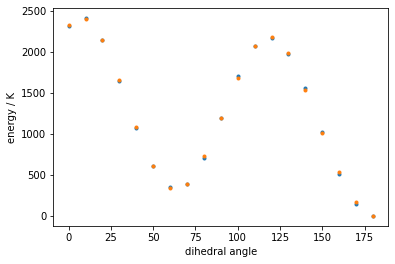

In [19]:

p0 = torsion_pots[opt]["p"]
f = torsion_fit( energies ,molecule, coordinates, pair_pots, angle_pots, torsion_pots, [opt], 
                additional_charge_numbers=special_bond_numbers, additional_mie_numbers=additional_mie_numbers)
xx = minimize(f.f,p0)
print(p0)
print(xx)

plt.plot(angles,energies,".")
plt.plot(angles,f.pot_energies,".")
plt.xlabel("dihedral angle")
plt.ylabel("energy / K")
plt.show()
plt.close()


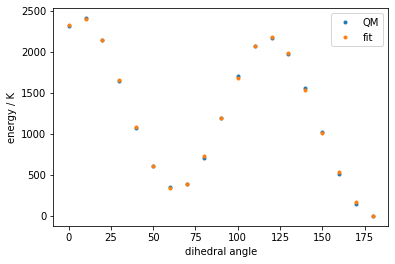

In [20]:
plt.plot(angles,energies,".",label="QM")
plt.plot(angles,f.pot_energies,".",label="fit")
plt.xlabel("dihedral angle")
plt.ylabel("energy / K")
plt.legend()
plt.savefig( "_".join( [opt] ) + ".png" )
plt.savefig( "_".join( [opt] ) + ".pdf" )
plt.savefig(name+"_FIT_QM_vs_FF_torsion_scan"+path.split(name)[-1].split("/")[1]+".png")
plt.show()
plt.close()

In [21]:
torsion_pots[opt]

{'list': ['OH_alcohol', 'CH2_alcohol', 'CH2_alcohol', 'OH_alcohol'],
 'type': 6,
 'p': array([ 1.33800820e+03, -3.92350224e+03,  5.59789233e+02,  4.27153852e+03,
        -1.85996960e+03,  1.27632968e+03,  1.54931832e+03, -1.18226167e+03,
         1.49011612e-08])}